## Self-Supervised Learning for Anomaly Detection on MVTec AD and AutoVI Datasets

### Introduction


Dans ce mini-projet, nous explorons l'application de l'apprentissage auto-supervisé **(Self-Supervised Learning, SSL)** pour la détection d'anomalies. L'apprentissage auto-supervisé est une méthode puissante qui permet d'entraîner des modèles sans nécessiter d'étiquettes explicites. Au lieu de cela, des tâches prétextuelles sont générées à partir des données elles-mêmes, permettant au modèle d'apprendre des représentations utiles pour des tâches en aval.

### Problématique

La détection d'anomalies est un défi important dans de nombreux domaines industriels, car les anomalies sont rares, imprévisibles et spécifiques à chaque application. Dans ce contexte, l'apprentissage auto-supervisé offre une approche efficace pour entraîner des modèles sur des données normales uniquement, en exploitant des représentations apprises pour identifier les écarts significatifs (anomalies).

### Datasets

Nous utilisons deux datasets de référence pour l'anomaly detection :

1. **MVTec AD** : Un dataset industriel comprenant plusieurs catégories (ex. bouteilles, noisettes, capsules, brosses à dents) avec des images normales et anormales.
2. **AutoVI** : Un dataset plus spécialisé, ici limité à la catégorie "engine wiring".

### Import des librairies

On importe ci-dessous les librairies qui sont pertinentes pour notre projet.


In [1]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
import random
import torch.nn.functional as F

In [2]:
# Affiche la version installée de PyTorch pour vérifier si l'environnement est configuré correctement.
print(f"PyTorch version: {torch.__version__}")

# Vérifie si PyTorch a été compilé avec le support de MPS (Metal Performance Shader, architecture GPU d'Apple).
print(f"Is MPS (Metal Performance Shader) built? {torch.backends.mps.is_built()}")

# Vérifie si le backend MPS est disponible sur l'appareil actuel. Cela dépend de la présence d'un GPU compatible (par exemple, sur les Mac récents).
print(f"Is MPS available? {torch.backends.mps.is_available()}")

# Définit l'appareil à utiliser pour les calculs. Si MPS est disponible, il est sélectionné, sinon, on utilise le CPU.
device = "mps" if torch.backends.mps.is_available() else "cpu"

# Affiche l'appareil qui sera utilisé pour les calculs par PyTorch.
print(f"Using device: {device}")


PyTorch version: 2.4.1
Is MPS (Metal Performance Shader) built? True
Is MPS available? True
Using device: mps


### Préparation des données

On définit les fonctions **load_train_data** et **load_test_data** pour charger et prétraiter respectivement les données d'entrainement et de test.

In [3]:
def load_train_data(path, img_size=(256, 256), batch_size=16):
    transform = transforms.Compose([
        transforms.Resize(img_size),        # Redimensionner les images
        transforms.ToTensor()              # Convertir les images en tenseurs PyTorch  #
    ])
    
    # Charger les données d'entraînement avec ImageFolder
    dataset = datasets.ImageFolder(root=path, transform=transform)
    
    return DataLoader(dataset, batch_size=batch_size, shuffle=True)


In [4]:
def load_test_data(test_dir, img_size=(256, 256), batch_size=16, shuffle=False):
    
    transform = transforms.Compose([
        transforms.Resize(img_size),
        transforms.ToTensor()
    ])
    
    # Liste pour stocker les chemins des images et leurs labels
    data = []
    
    # Parcourir les sous-dossiers
    for folder in os.listdir(test_dir):
        folder_path = os.path.join(test_dir, folder)
        if os.path.isdir(folder_path):  # Vérifier que c'est un dossier
            label = 0 if folder == "good" else 1  # 0 pour normal, 1 pour anomalie
            for img_file in os.listdir(folder_path):
                if img_file.endswith(('.png', '.jpg', '.jpeg')):
                    data.append((os.path.join(folder_path, img_file), label))
    # Dataset inline
    class SimpleDataset:
        def __init__(self, data, transform):
            self.data = data
            self.transform = transform
        
        def __len__(self):
            return len(self.data)
        
        def __getitem__(self, idx):
            img_path, label = self.data[idx]
            image = Image.open(img_path).convert("RGB")
            return self.transform(image), label

    # Créer le DataLoader
    dataset = SimpleDataset(data, transform)
    return DataLoader(dataset, batch_size=batch_size, shuffle=shuffle)


## Architecture : encodeur et décodeur

Cette architecture d'auto-encodeur est conçue pour la détection d'anomalies dans des images. Elle se compose d'un encodeur qui réduit la résolution spatiale tout en augmentant le nombre de canaux pour extraire des caractéristiques essentielles, et d'un décodeur qui reconstruit les images à partir d'une représentation latente compacte. L'encodeur utilise des convolutions avec des strides de 2 pour compresser les images, tandis que le décodeur utilise des convolutions transposées pour restaurer la résolution initiale. Entraînée uniquement sur des données normales, l'architecture détecte les anomalies grâce à une erreur de reconstruction élevée lorsque des images anormales sont introduites.
On utilise cette architecture pour nos deux modèles Inpainting ainsi que le Masked Auto Encoder (MAE).






In [5]:
class Encoder(nn.Module):
    def __init__(self, in_channels=3, latent_dim=128):
        super(Encoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=4, stride=2, padding=1),  # 256x256 -> 128x128
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),  # 128x128 -> 64x64
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),  # 64x64 -> 32x32
            nn.ReLU(),
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),  # 32x32 -> 16x16
            nn.ReLU(),
            nn.Conv2d(512, 1024, kernel_size=4, stride=2, padding=1),  # 16x16 -> 8x8
            nn.ReLU(),
            nn.Conv2d(1024, latent_dim, kernel_size=4, stride=2, padding=1),  # 8x8 -> 4x4
            nn.ReLU()
        )


    def forward(self, x):
        return self.encoder(x)

class Decoder(nn.Module):
    def __init__(self, latent_dim=128, out_channels=3):
        super(Decoder, self).__init__()
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(latent_dim, 1024, kernel_size=4, stride=2, padding=1),  # 4x4 -> 8x8
            nn.ReLU(),
            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1),  # 8x8 -> 16x16
            nn.ReLU(),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),  # 16x16 -> 32x32
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # 32x32 -> 64x64
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # 64x64 -> 128x128
            nn.ReLU(),
            nn.ConvTranspose2d(64, out_channels, kernel_size=4, stride=2, padding=1),  # 128x128 -> 256x256
            nn.Sigmoid()  # Normaliser entre [0, 1]
        )

    def forward(self, x):
        return self.decoder(x)

## Fonction d'entrainement du modèle SSL

In [6]:
#Fonction pour entrainer le modèle
def train_ssl_model(model, 
                    train_loader, 
                    val_loader, 
                    criterion, 
                    optimizer, 
                    device='mps', 
                    epochs=20):
    model.to(device)
    criterion.to(device)

    for epoch in range(epochs):
        # Phase d'entraînement
        model.train()
        total_train_loss = 0.0
        for images, _ in train_loader:
            images = images.to(device)
            optimizer.zero_grad()

            # Forward pass
            reconstructed, masked = model(images)

            # Calcul de la perte
            loss = criterion(reconstructed, images)
            loss.backward()
            optimizer.step()
            total_train_loss += loss.item()

        avg_train_loss = total_train_loss / len(train_loader)

        # Phase de validation
        model.eval()
        total_val_loss = 0.0
        with torch.no_grad():
            for images, _ in val_loader:
                images = images.to(device)
                reconstructed, masked = model(images)

                # Calcul de la perte de validation
                val_loss = criterion(reconstructed, images)
                total_val_loss += val_loss.item()

        avg_val_loss = total_val_loss / len(val_loader)

        # Affichage des pertes pour chaque époque
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")


## Les Fonctions Loss utilisées :

Le **SSIM Loss (Structural Similarity Index Loss)** est une fonction de perte qui mesure la différence entre deux images en se basant sur leur similarité structurelle, plutôt que de simplement comparer les valeurs de leurs pixels comme le font des métriques comme MSE (Mean Squared Error) ou MAE (Mean Absolute Error).



In [7]:
class SSIMLoss(nn.Module):
    def __init__(self, window_size=11, size_average=True):
        super(SSIMLoss, self).__init__()
        self.window_size = window_size
        self.size_average = size_average
        self.channel = 1  # Default for grayscale; will be updated dynamically in forward.

    def create_window(self, channel, dtype, device):
        def gaussian(window_size, sigma):
            coords = torch.arange(window_size, dtype=dtype, device=device)  # Ensure consistent type and device
            gauss = torch.exp(-(coords - window_size // 2) ** 2 / (2 * sigma ** 2))
            return gauss / gauss.sum()

        _1D_window = gaussian(self.window_size, 1.5).unsqueeze(1)
        window = _1D_window.mm(_1D_window.t()).unsqueeze(0).unsqueeze(0)  # Shape: [1, 1, window_size, window_size]
        window = window.expand(channel, 1, self.window_size, self.window_size).contiguous()
        return window

    def forward(self, img1, img2):
        # Ensure input tensors have the same dtype and device
        device = img1.device
        dtype = img1.dtype

        # Update the window dynamically based on the input channels
        channel = img1.size(1)
        if self.channel != channel or not hasattr(self, 'window') or self.window.device != device:
            self.channel = channel
            self.window = self.create_window(channel, dtype, device)

        # SSIM constants
        C1 = 0.01 ** 2
        C2 = 0.03 ** 2

        # Compute local means (mu1, mu2)
        mu1 = F.conv2d(img1, self.window, padding=self.window_size // 2, groups=channel)
        mu2 = F.conv2d(img2, self.window, padding=self.window_size // 2, groups=channel)

        # Compute local variances and covariances
        mu1_sq = mu1 ** 2
        mu2_sq = mu2 ** 2
        mu1_mu2 = mu1 * mu2

        sigma1_sq = F.conv2d(img1 * img1, self.window, padding=self.window_size // 2, groups=channel) - mu1_sq
        sigma2_sq = F.conv2d(img2 * img2, self.window, padding=self.window_size // 2, groups=channel) - mu2_sq
        sigma12 = F.conv2d(img1 * img2, self.window, padding=self.window_size // 2, groups=channel) - mu1_mu2

        # Compute SSIM map
        ssim_map = ((2 * mu1_mu2 + C1) * (2 * sigma12 + C2)) / ((mu1_sq + mu2_sq + C1) * (sigma1_sq + sigma2_sq + C2))

        if self.size_average:
            return 1 - ssim_map.mean()  # Return (1 - SSIM) as the loss
        else:
            return 1 - ssim_map


La **Perceptual Loss** est une fonction de coût utilisée pour comparer des images en mesurant les différences dans un espace de caractéristiques extraites par un modèle de vision pré-entraîné, comme VGG16. Contrairement aux pertes traditionnelles comme la MSE (Mean Squared Error) ou la L1 Loss, qui évaluent les différences pixel par pixel, la Perceptual Loss évalue les images en termes de leurs structures, textures et contenus perceptuels.

In [8]:
import torch
import torch.nn as nn
from torchvision.models import vgg16
from torchvision.models.feature_extraction import create_feature_extractor

class PerceptualLoss(nn.Module):
    def __init__(self):
        super(PerceptualLoss, self).__init__()
        # Charger un modèle pré-entraîné (VGG16 dans ce cas)
        vgg = vgg16(pretrained=True)
        # Extraire des couches spécifiques (par exemple, ReLU2_2 pour les détails moyens)
        self.feature_extractor = create_feature_extractor(vgg, return_nodes={'features.5': 'relu2_2'})
        self.mse_loss = nn.MSELoss()

        # Geler les poids du modèle pré-entraîné
        for param in self.feature_extractor.parameters():
            param.requires_grad = False

    def forward(self, reconstructed, original):
        # Extraire les caractéristiques
        original_features = self.feature_extractor(original)['relu2_2']
        reconstructed_features = self.feature_extractor(reconstructed)['relu2_2']
        # Calculer la perte MSE sur les caractéristiques
        loss = self.mse_loss(reconstructed_features, original_features)
        return loss


#### Fonction pour calculer les scores d'anomalie :
Ce code calcule les scores d'anomalie pour un ensemble de données de test en utilisant la perte MSE (Mean Squared Error) entre les images d'origine et leurs reconstructions. Ces scores seront ensuite utilisés pour évaluer les performances du modèle en détectant des anomalies.

In [9]:
#On utilise MSE pour les scores anomalies
def compute_mse_loss(reconstructed, original):
   
    per_pixel_loss = F.mse_loss(reconstructed, original, reduction='none')  # [B, C, H, W]
    per_sample_loss = per_pixel_loss.mean(dim=[1, 2, 3])  # Average over channels (C), height (H), width (W)
    return per_sample_loss

def calculate_anomaly_scores(model, test_loader, device='cpu'):
    model.eval()
    model.to(device)

    anomaly_scores = []
    labels = []

    with torch.no_grad():
        for images, targets in test_loader:
            images = images.to(device)
            targets = targets.to(device)

            # Forward pass
            reconstructed, _ = model(images)

            # Compute MSE loss per sample
            loss = compute_mse_loss(reconstructed, images)  # Shape: [batch_size]

            # Save anomaly scores and labels
            anomaly_scores.extend(loss.cpu().numpy())  # Per-sample reconstruction loss
            labels.extend(targets.cpu().numpy())       # Ground-truth labels

    return anomaly_scores, labels


#### Fonction pour tracer la courbe ROC et AUROC :
Cette fonction permet d'évaluer les performances du modèle pour la détection d'anomalies à l'aide de la courbe **ROC (Receiver Operating Characteristic)** et du score **AUROC (Area Under ROC Curve)**. Ces métriques permettent de mesurer la capacité du modèle à distinguer les anomalies des données normales.



In [10]:
#Tracer la courbe Auroc
def plot_roc_and_auroc(anomaly_scores, labels):
    # Compute ROC curve
    fpr, tpr, _ = roc_curve(labels, anomaly_scores)

    # Compute AUROC
    auc_score = roc_auc_score(labels, anomaly_scores)

    # Plot ROC curve
    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'AUROC = {auc_score:.4f}', color='blue')
    plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Anomaly Detection')
    plt.legend(loc='lower right')
    plt.grid()
    plt.show()

    print(f"AUROC: {auc_score:.4f}")

#### Fonction pour tracer la carte d'erreurs
Une carte d'erreurs est une visualisation en deux dimensions qui met en évidence les différences entre deux images, typiquement une image d'origine et sa reconstruction générée par un modèle. Les pixels de cette carte représentent l'intensité de l'erreur ou de la différence, permettant d'identifier visuellement les régions où le modèle a échoué à reproduire fidèlement l'image d'entrée.

In [11]:
def show_images(original, masked, reconstructed):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(original.permute(1, 2, 0).cpu())
    axes[0].set_title("Original")
    axes[1].imshow(masked.permute(1, 2, 0).cpu())
    axes[1].set_title("Masquée")
    axes[2].imshow(reconstructed.permute(1, 2, 0).cpu())
    axes[2].set_title("Reconstruite")
    plt.show()

def anomaly_detection_map (images,reconstructed,index):
    error_map = torch.abs(images[index] - reconstructed[index]).mean(dim=0)  
    plt.imshow(error_map.cpu().numpy(), cmap='jet')  
    plt.colorbar()
    plt.title("Carte d'Erreurs")
    plt.show()


## Fonction visualize_reconstructions :

La fonction **visualize_reconstructions** a pour but de visualiser et comparer les résultats d'un modèle de colorisation d'images, en affichant :

1. Les images en niveaux de gris (grayscale input).

2. Les images originales en couleur (ground truth).

3. Les images colorisées produites par le modèle (colorized output).


In [ ]:
import random

# Visualize colorization on random test images

def visualize_reconstructions(model, data_loader, device, num_images=5):
    # Set the model to evaluation mode
    model.eval()

    # Convert the DataLoader to a list to randomly sample images
    dataset = list(data_loader.dataset)

    # Randomly select `num_images` images from the dataset
    random_indices = random.sample(range(len(dataset)), num_images)
    random_images = [dataset[i][0] for i in random_indices]  # Extract only the images, ignoring labels

    # Stack the images into a batch
    images = torch.stack(random_images)

    # Move images to the specified device
    images = images.to(device)
    
    # Run the grayscale images through the colorization model
    with torch.no_grad():
        reconstructed_images, perturbed_images = model(images)
    
    # Move images back to CPU for visualization
    images = images.cpu()
    reconstructed_images = reconstructed_images.cpu()
    perturbed_images = perturbed_images.cpu()
    
    # Plot the grayscale, ground truth, and colorized images
    fig, axes = plt.subplots(num_images, 3, figsize=(10, num_images * 4))
    for i in range(num_images):
        # Grayscale input
        axes[i, 0].imshow(perturbed_images[i].permute(1, 2, 0).squeeze(), cmap='gray')
        axes[i, 0].set_title("Grayscale Input")
        axes[i, 0].axis('off')
        
        # Ground truth (original RGB image)
        axes[i, 1].imshow(images[i].permute(1, 2, 0))
        axes[i, 1].set_title("Ground Truth (RGB)")
        axes[i, 1].axis('off')
        
        # Colorized output from the model
        axes[i, 2].imshow(reconstructed_images[i].permute(1, 2, 0))
        axes[i, 2].set_title("Colorized Output")
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

### Objectif du Notebook
Dans ce notebook, nous explorons différentes méthodes de Self-Supervised Learning (SSL) pour détecter des anomalies dans des images, en utilisant le dataset **MVTec AD** et **AutoVI**. L'objectif est de comparer et évaluer les performances de plusieurs approches de détection d'anomalies :
1. **Masked Autoencoder (MAE)** 
2. **Inpainting Model** 
3. **Colorizing Model**

## Masked Autoencoder (MAE) 

Le **Masked Autoencoder (MAE)** est une méthode de Self-Supervised Learning (SSL) qui repose sur le **masquage partiel des données d'entrée** pour entraîner un modèle à prédire les parties masquées. 

In [92]:
class MaskedAutoencoderModel(nn.Module):
    def __init__(self, latent_dim=128, mask_ratio=0.3):
        super(MaskedAutoencoderModel, self).__init__()
        self.encoder = Encoder(latent_dim=latent_dim)
        self.decoder = Decoder(latent_dim=latent_dim)
        self.mask_ratio = mask_ratio

    def forward(self, x):
        x_masked = self.apply_mask(x)
        z = self.encoder(x_masked)
        reconstructed = self.decoder(z)
        return reconstructed, x_masked

    def apply_mask(self, x, patch_size=16):
        B, C, H, W = x.shape
        mask = torch.rand((B, H // patch_size, W // patch_size), device=x.device) < self.mask_ratio
        mask = mask.repeat_interleave(patch_size, 1).repeat_interleave(patch_size, 2)
        mask = mask.unsqueeze(1).repeat(1, C, 1, 1)
        x_masked = x.clone()
        x_masked[mask] = 0
        return x_masked

## INPAINTING MODEL

Un **modèle d'inpainting** est une méthode de Self-Supervised Learning (SSL) qui consiste à masquer une partie d'une image et à entraîner un modèle à **reconstruire la région masquée**. 
Il apprend à prédire les parties manquantes d'une image (régions masquées) à partir des parties visibles, en exploitant les relations contextuelles et structurelles, et les anomalies sont détectées comme des régions mal reconstruites, car elles ne suivent pas les patterns appris des données normales.

In [93]:
#Inpainting model
class InpaintingModel(nn.Module):
    def __init__(self, latent_dim=128, mask_size=8):
        super(InpaintingModel, self).__init__()
        self.encoder = Encoder(latent_dim=latent_dim)
        self.decoder = Decoder(latent_dim=latent_dim)
        self.mask_size = mask_size

    def forward(self, x):
        x_masked = self.apply_mask(x)
        z = self.encoder(x_masked)
        return self.decoder(z), x_masked
    
    def apply_mask(self, x):
        masked_x = x.clone()

        for i in range(masked_x.size(0)):
            ul_x = np.random.randint(0, x.size(2) - self.mask_size + 1)
            ul_y = np.random.randint(0, x.size(3) - self.mask_size + 1)
            masked_x[i, :, ul_x:ul_x+self.mask_size, ul_y:ul_y+self.mask_size] = 0

        return masked_x

## Colorizing Model


Le modèle de **"Colorizing"** est une approche intéressante dans le domaine de la détection d'anomalies. Il est basé sur la reconstruction d'une image en couleurs à partir d'une version réduite ou en niveaux de gris. L'idée principale est d'exploiter les différences entre les données normales et les anomalies, car ces dernières auront des caractéristiques distinctes, souvent mal reconstruites par un modèle entraîné uniquement sur des données normales.



In [12]:
class ColorizationModel(nn.Module):
    def __init__(self, latent_dim=128):
        super(ColorizationModel, self).__init__()
        self.encoder = Encoder(latent_dim=latent_dim, in_channels=1)  # Input grayscale
        self.decoder = Decoder(latent_dim=latent_dim, out_channels=3)  # Predict RGB

    def forward(self, x):
        grayscale_x = transforms.Grayscale()(x)  # Convert RGB to Grayscale
        z = self.encoder(grayscale_x)
        return self.decoder(z), grayscale_x

## 1. Dataset MVTec AD:

### a) Catégorie "Bottle"

In [16]:
#Chargement des données Train bottle
train_path_bottle="/Users/macbookpro/Desktop/HDDL/SSL/bottle/train"
train_loader_bottle = load_train_data(train_path_bottle, img_size=(256, 256), batch_size=32)

In [17]:
#Chargement des données Test bottle
test_path_bottle="/Users/macbookpro/Desktop/HDDL/SSL/bottle/test"
test_loader_bottle = load_test_data(test_path_bottle)

#### Masked Autoenconder for bottle dataset

In [ ]:
MAE_model_bottle = MaskedAutoencoderModel(latent_dim=128, mask_ratio=1/16)
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True)  
optimizer = optim.Adam(MAE_model_bottle.parameters(), lr=1e-3)
# Entraînement du modèle MAE sur le dataset Bottle
train_ssl_model(MAE_model_bottle, train_loader_bottle, test_loader_bottle, ssim_loss_fn, optimizer,epochs=25)

Epoch 1/25, Train Loss: 0.5165, Val Loss: 0.5089
Epoch 2/25, Train Loss: 0.5148, Val Loss: 0.5085
Epoch 3/25, Train Loss: 0.5144, Val Loss: 0.5078
Epoch 4/25, Train Loss: 0.5130, Val Loss: 0.5062
Epoch 5/25, Train Loss: 0.5097, Val Loss: 0.4991
Epoch 6/25, Train Loss: 0.4877, Val Loss: 0.5970
Epoch 7/25, Train Loss: 0.4978, Val Loss: 0.4895
Epoch 8/25, Train Loss: 0.4736, Val Loss: 0.4251
Epoch 9/25, Train Loss: 0.3680, Val Loss: 0.2998
Epoch 10/25, Train Loss: 0.2667, Val Loss: 0.2372
Epoch 11/25, Train Loss: 0.2260, Val Loss: 0.2193
Epoch 12/25, Train Loss: 0.1962, Val Loss: 0.1989
Epoch 13/25, Train Loss: 0.1779, Val Loss: 0.1890
Epoch 14/25, Train Loss: 0.1648, Val Loss: 0.1780
Epoch 15/25, Train Loss: 0.1562, Val Loss: 0.1743
Epoch 16/25, Train Loss: 0.1514, Val Loss: 0.1698
Epoch 17/25, Train Loss: 0.1476, Val Loss: 0.1684
Epoch 18/25, Train Loss: 0.1452, Val Loss: 0.1679
Epoch 19/25, Train Loss: 0.1437, Val Loss: 0.1658
Epoch 20/25, Train Loss: 0.1428, Val Loss: 0.1635
Epoch 21/

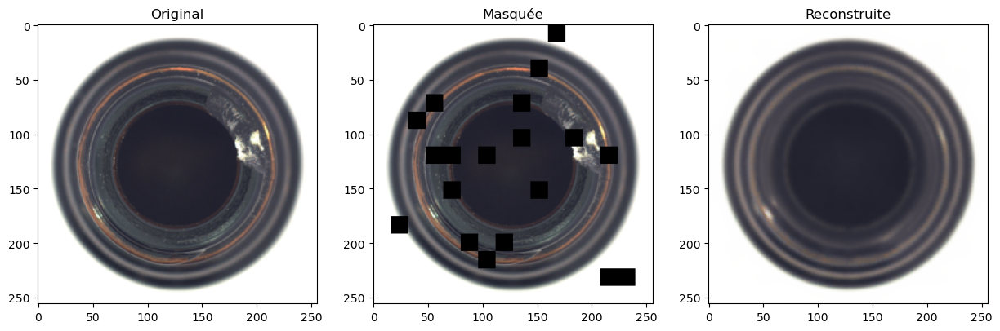

In [17]:
# Exemple d'une image
with torch.no_grad():
    images_bottle, _ = next(iter(test_loader_bottle))
    images_bottle = images_bottle.to('mps')
    reconstructed_bottle, masked_bottle = MAE_model_bottle(images_bottle)

    show_images(images_bottle[0], masked_bottle[0], reconstructed_bottle[0])

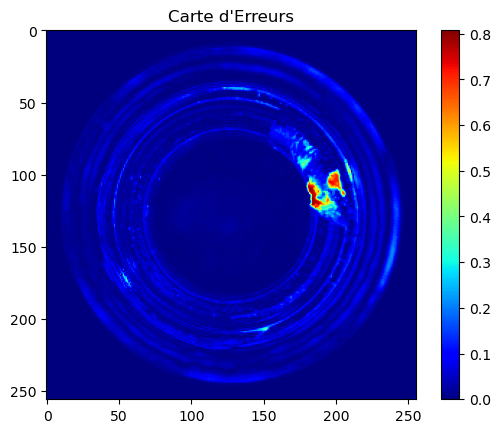

In [18]:
#Détection d'anomalie sur l'exemple précédent
anomaly_detection_map (images_bottle,reconstructed_bottle,0)

In [19]:
#Calcul des scores d'anomalie pour le modèle MAE avec le data set Bottle
x,y=calculate_anomaly_scores(MAE_model_bottle, test_loader_bottle, device='cpu')

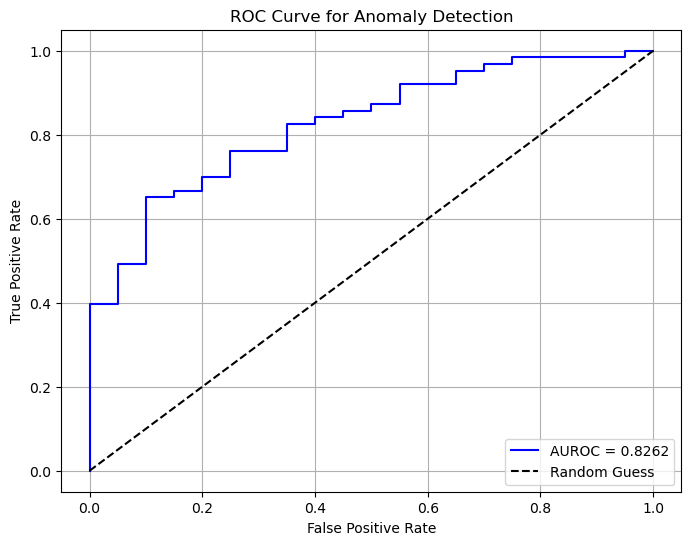

AUROC: 0.8262


In [20]:
#Tracer la courbe ROC associé au modèle MAE avec le data set Bottle
plot_roc_and_auroc(x, y)

#### Inpainting model for bottle dataset

In [21]:
Inpainting_model_bottle = InpaintingModel(latent_dim=128,mask_size=30)
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True)  
optimizer = optim.Adam(Inpainting_model_bottle.parameters(), lr=1e-3)
# Entraînement du modèle Inpainting sur le dataset Bottle
train_ssl_model(Inpainting_model_bottle, train_loader_bottle, test_loader_bottle, ssim_loss_fn, optimizer,epochs=20)

Epoch 1/20, Train Loss: 0.5335, Val Loss: 0.5088
Epoch 2/20, Train Loss: 0.5149, Val Loss: 0.5086
Epoch 3/20, Train Loss: 0.5146, Val Loss: 0.5083
Epoch 4/20, Train Loss: 0.5141, Val Loss: 0.5079
Epoch 5/20, Train Loss: 0.5137, Val Loss: 0.5070
Epoch 6/20, Train Loss: 0.5125, Val Loss: 0.5057
Epoch 7/20, Train Loss: 0.5106, Val Loss: 0.5023
Epoch 8/20, Train Loss: 0.4995, Val Loss: 0.4868
Epoch 9/20, Train Loss: 0.4694, Val Loss: 0.4406
Epoch 10/20, Train Loss: 0.4129, Val Loss: 0.3962
Epoch 11/20, Train Loss: 0.3734, Val Loss: 0.3519
Epoch 12/20, Train Loss: 0.3425, Val Loss: 0.3383
Epoch 13/20, Train Loss: 0.3081, Val Loss: 0.2714
Epoch 14/20, Train Loss: 0.2527, Val Loss: 0.2398
Epoch 15/20, Train Loss: 0.2237, Val Loss: 0.2252
Epoch 16/20, Train Loss: 0.2027, Val Loss: 0.2060
Epoch 17/20, Train Loss: 0.1852, Val Loss: 0.1932
Epoch 18/20, Train Loss: 0.1717, Val Loss: 0.1821
Epoch 19/20, Train Loss: 0.1606, Val Loss: 0.1766
Epoch 20/20, Train Loss: 0.1546, Val Loss: 0.1724


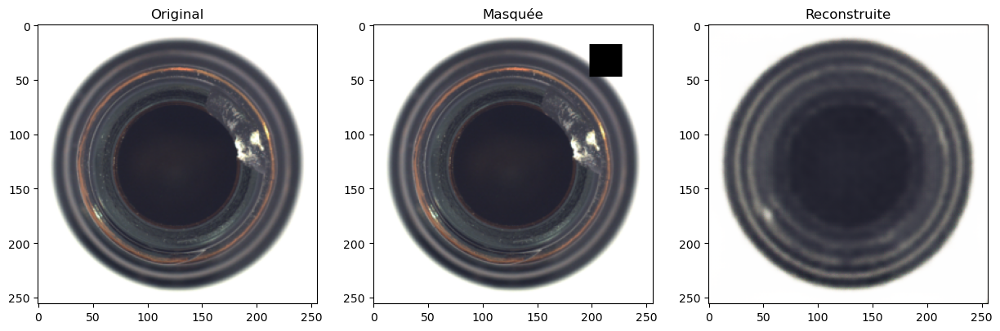

In [ ]:
#Exemple d'une image
with torch.no_grad():
    images_bottle, _ = next(iter(test_loader_bottle))
    images_bottle = images_bottle.to('mps')
    reconstructed_bottle_inpainting, masked_bottle_inpainting = Inpainting_model_bottle(images_bottle)

    show_images(images_bottle[0], masked_bottle_inpainting[0], reconstructed_bottle_inpainting[0])

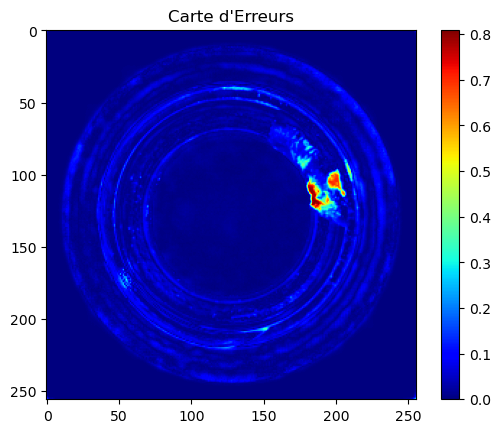

In [23]:
#Détection d'anomalie sur l'exemple précédent
anomaly_detection_map (images_bottle,reconstructed_bottle_inpainting,0)

In [24]:
#Calcul des scores d'anomalie pour le modèle Inpainting avec le dataset Bottle
x1,y1=calculate_anomaly_scores(Inpainting_model_bottle, test_loader_bottle, device='cpu')

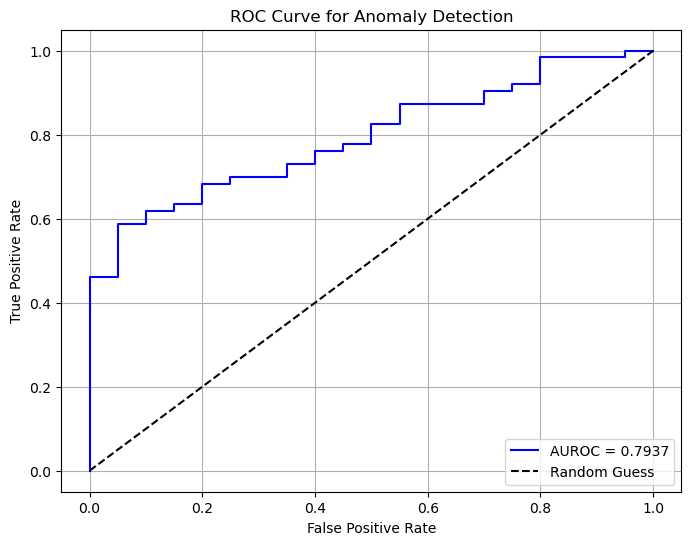

AUROC: 0.7937


In [25]:
#Tracer la courbe ROC associé au modèle Inpainting avec le dataset Bottle
plot_roc_and_auroc(x1, y1)

##

#### Colorizing Model for bottle data set

In [60]:
colorization_model_bottle = ColorizationModel(latent_dim=256)
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True) 
colorization_encoder = train_ssl_model(colorization_model_bottle, 
                                       train_loader_bottle, 
                                       test_loader_bottle, 
                                       criterion=nn.MSELoss(), 
                                       optimizer=optim.Adam(colorization_model_bottle.parameters(), lr=0.001),
                                       epochs=30
                                       )

Epoch 1/30, Train Loss: 0.1304, Val Loss: 0.1224
Epoch 2/30, Train Loss: 0.1274, Val Loss: 0.1172
Epoch 3/30, Train Loss: 0.1124, Val Loss: 0.1042
Epoch 4/30, Train Loss: 0.0759, Val Loss: 0.0419
Epoch 5/30, Train Loss: 0.0277, Val Loss: 0.0255
Epoch 6/30, Train Loss: 0.0138, Val Loss: 0.0110
Epoch 7/30, Train Loss: 0.0088, Val Loss: 0.0080
Epoch 8/30, Train Loss: 0.0061, Val Loss: 0.0061
Epoch 9/30, Train Loss: 0.0048, Val Loss: 0.0055
Epoch 10/30, Train Loss: 0.0042, Val Loss: 0.0051
Epoch 11/30, Train Loss: 0.0039, Val Loss: 0.0049
Epoch 12/30, Train Loss: 0.0036, Val Loss: 0.0048
Epoch 13/30, Train Loss: 0.0034, Val Loss: 0.0046
Epoch 14/30, Train Loss: 0.0033, Val Loss: 0.0046
Epoch 15/30, Train Loss: 0.0031, Val Loss: 0.0045
Epoch 16/30, Train Loss: 0.0030, Val Loss: 0.0044
Epoch 17/30, Train Loss: 0.0030, Val Loss: 0.0046
Epoch 18/30, Train Loss: 0.0029, Val Loss: 0.0045
Epoch 19/30, Train Loss: 0.0028, Val Loss: 0.0042
Epoch 20/30, Train Loss: 0.0027, Val Loss: 0.0042
Epoch 21/

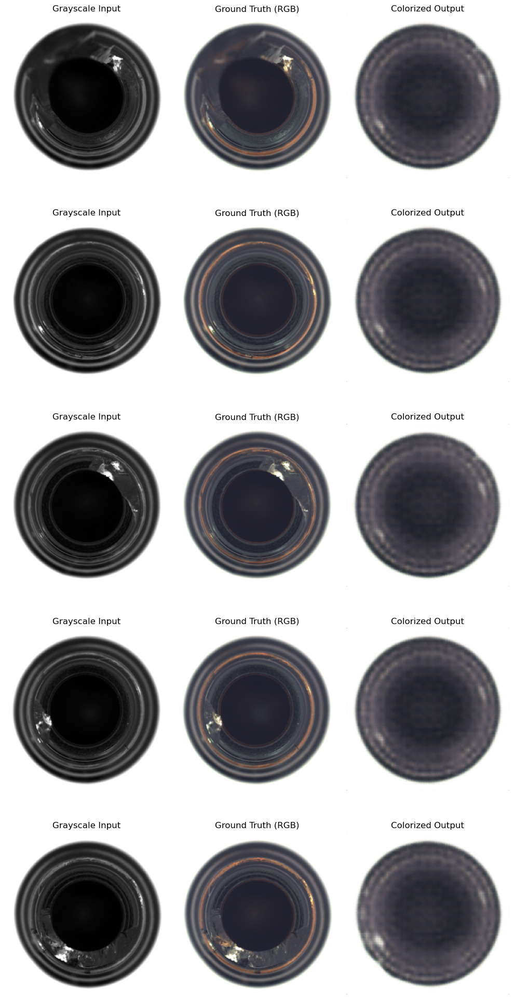

In [61]:
visualize_reconstructions(colorization_model_bottle, test_loader_bottle, device)

In [62]:
x2,y2=calculate_anomaly_scores(colorization_model_bottle, test_loader_bottle, device='cpu')

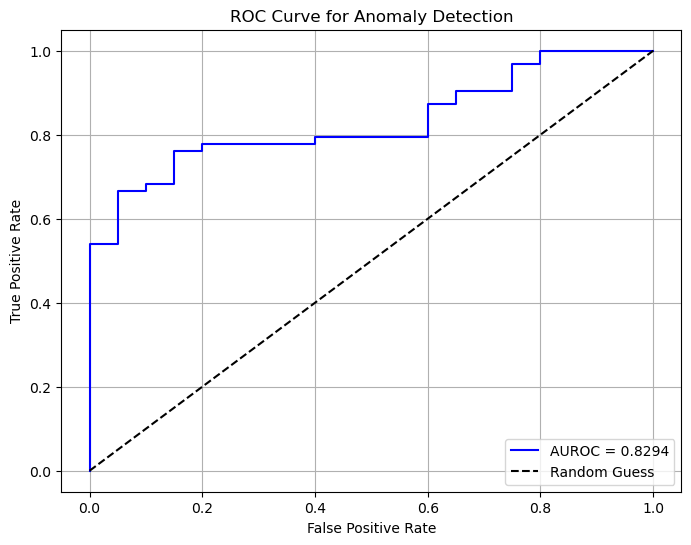

AUROC: 0.8294


In [63]:
#Tracer la courbe ROC associé au modèle Colorizing avec le dataset Bottle
plot_roc_and_auroc(x2, y2)

### b) Catégorie "Capsule"

In [65]:
#Chargement des données Train capsule
train_path_capsule="/Users/macbookpro/Desktop/HDDL/SSL/capsule/train"
train_loader_capsule = load_train_data(train_path_capsule, img_size=(256, 256), batch_size=8)

In [66]:
#Chargement des données Test capsule
test_path_capsule="/Users/macbookpro/Desktop/HDDL/SSL/capsule/test"
test_loader_capsule = load_test_data(test_path_capsule)

#### Masked Autoencoder for capsule dataset

In [30]:
MAE_model_capsule = MaskedAutoencoderModel(latent_dim=256, mask_ratio=1/16) 

optimizer = optim.Adam(MAE_model_capsule.parameters(), lr=1e-3)
# Entraînement du modèle MAE sur le dataset Capsule
train_ssl_model(MAE_model_capsule, train_loader_capsule, test_loader_capsule, PerceptualLoss() , optimizer,epochs=20)

/opt/anaconda3/envs/torch/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/envs/torch/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20, Train Loss: 0.4616, Val Loss: 0.1256
Epoch 2/20, Train Loss: 0.1236, Val Loss: 0.1195
Epoch 3/20, Train Loss: 0.1128, Val Loss: 0.1059
Epoch 4/20, Train Loss: 0.0888, Val Loss: 0.0804
Epoch 5/20, Train Loss: 0.0620, Val Loss: 0.0619
Epoch 6/20, Train Loss: 0.0501, Val Loss: 0.0543
Epoch 7/20, Train Loss: 0.0434, Val Loss: 0.0514
Epoch 8/20, Train Loss: 0.0409, Val Loss: 0.0502
Epoch 9/20, Train Loss: 0.0398, Val Loss: 0.0494
Epoch 10/20, Train Loss: 0.0388, Val Loss: 0.0486
Epoch 11/20, Train Loss: 0.0378, Val Loss: 0.0478
Epoch 12/20, Train Loss: 0.0369, Val Loss: 0.0471
Epoch 13/20, Train Loss: 0.0356, Val Loss: 0.0454
Epoch 14/20, Train Loss: 0.0340, Val Loss: 0.0434
Epoch 15/20, Train Loss: 0.0320, Val Loss: 0.0412
Epoch 16/20, Train Loss: 0.0295, Val Loss: 0.0395
Epoch 17/20, Train Loss: 0.0279, Val Loss: 0.0389
Epoch 18/20, Train Loss: 0.0276, Val Loss: 0.0386
Epoch 19/20, Train Loss: 0.0298, Val Loss: 0.0419
Epoch 20/20, Train Loss: 0.0281, Val Loss: 0.0374


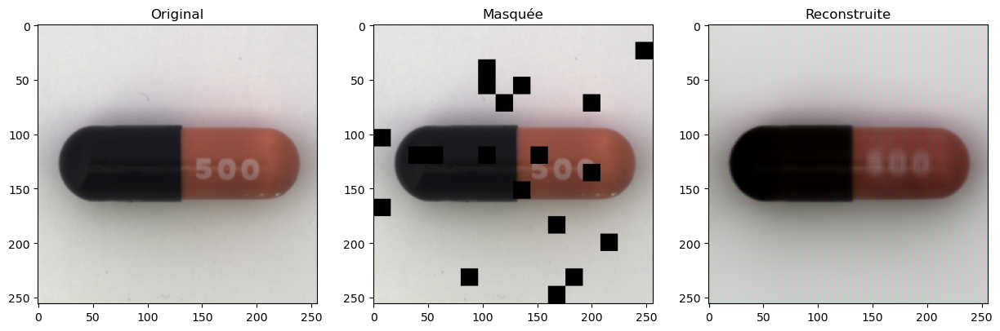

In [31]:
# Exemple d'une image
with torch.no_grad():
    images_capsule, _ = next(iter(test_loader_capsule))
    images_capsule = images_capsule.to('mps')
    reconstructed_capsule, masked_capsule = MAE_model_capsule(images_capsule)

    show_images(images_capsule[6], masked_capsule[6], reconstructed_capsule[6])

In [33]:
#Calcul des scores d'anomalie pour le modèle MAE avec le dataset Capsule
a1,b1=calculate_anomaly_scores(MAE_model_capsule, test_loader_capsule, device='cpu')

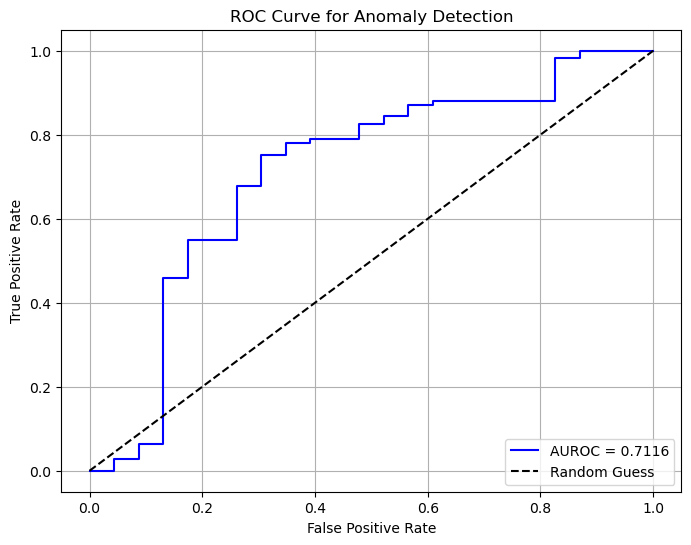

AUROC: 0.7116


In [34]:
#Tracer la courbe ROC associé au modèle MAE avec le dataset Capsule
plot_roc_and_auroc(a1, b1)

#### Inpainting model for capsule dataset

In [35]:
Inpainting_model_capsule = InpaintingModel(latent_dim=256,mask_size=30)
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True)  
optimizer = optim.Adam(Inpainting_model_capsule.parameters(), lr=1e-3)
# Entraînement du modèle Inpainting sur le dataset Capsule
train_ssl_model(Inpainting_model_capsule, train_loader_capsule, test_loader_capsule, PerceptualLoss(), optimizer,epochs=20)

/opt/anaconda3/envs/torch/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/envs/torch/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/20, Train Loss: 0.1287, Val Loss: 0.1254
Epoch 2/20, Train Loss: 0.1257, Val Loss: 0.1194
Epoch 3/20, Train Loss: 0.1073, Val Loss: 0.0888
Epoch 4/20, Train Loss: 0.0615, Val Loss: 0.0560
Epoch 5/20, Train Loss: 0.0419, Val Loss: 0.0483
Epoch 6/20, Train Loss: 0.0341, Val Loss: 0.0430
Epoch 7/20, Train Loss: 0.0303, Val Loss: 0.0405
Epoch 8/20, Train Loss: 0.0291, Val Loss: 0.0401
Epoch 9/20, Train Loss: 0.0287, Val Loss: 0.0397
Epoch 10/20, Train Loss: 0.0283, Val Loss: 0.0398
Epoch 11/20, Train Loss: 0.0280, Val Loss: 0.0398
Epoch 12/20, Train Loss: 0.0283, Val Loss: 0.0393
Epoch 13/20, Train Loss: 0.0281, Val Loss: 0.0393
Epoch 14/20, Train Loss: 0.0279, Val Loss: 0.0390
Epoch 15/20, Train Loss: 0.0279, Val Loss: 0.0400
Epoch 16/20, Train Loss: 0.0278, Val Loss: 0.0389
Epoch 17/20, Train Loss: 0.0277, Val Loss: 0.0403
Epoch 18/20, Train Loss: 0.0281, Val Loss: 0.0391
Epoch 19/20, Train Loss: 0.0277, Val Loss: 0.0400
Epoch 20/20, Train Loss: 0.0279, Val Loss: 0.0390


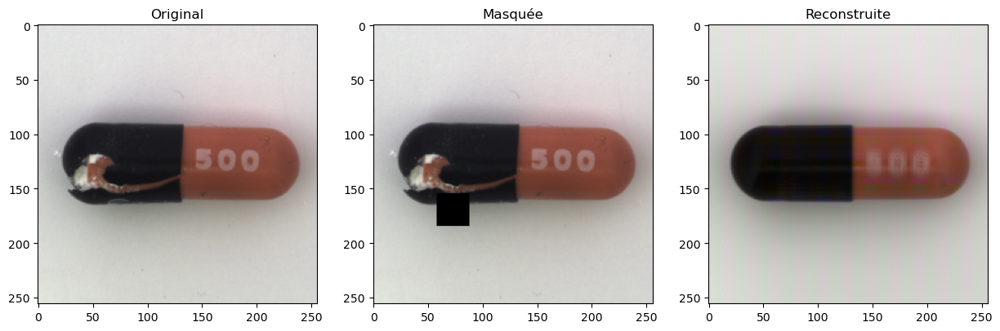

In [36]:
# Exemple d'une image
with torch.no_grad():
    images_capsule, _ = next(iter(test_loader_capsule))
    images_capsule = images_capsule.to('mps')
    reconstructed_capsule_inpainting, masked_capsule_inpainting = Inpainting_model_capsule(images_capsule)

    show_images(images_capsule[5], masked_capsule_inpainting[5], reconstructed_capsule_inpainting[5])

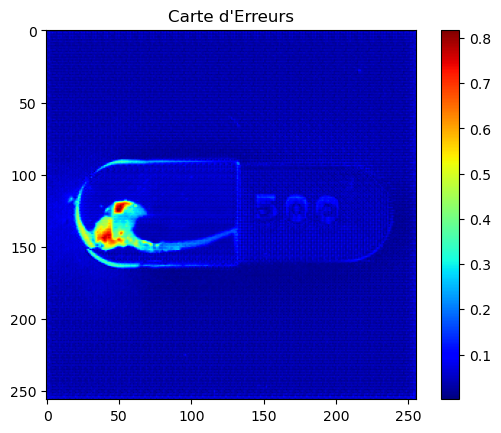

In [37]:
#Détection d'anomalie sur l'exemple précédent
anomaly_detection_map (images_capsule,reconstructed_capsule_inpainting,5)

In [38]:
#Calcul des scores d'anomalie pour le modèle Inpainting avec le dataset Capsule
a2,b2=calculate_anomaly_scores(Inpainting_model_capsule, test_loader_capsule, device='cpu')

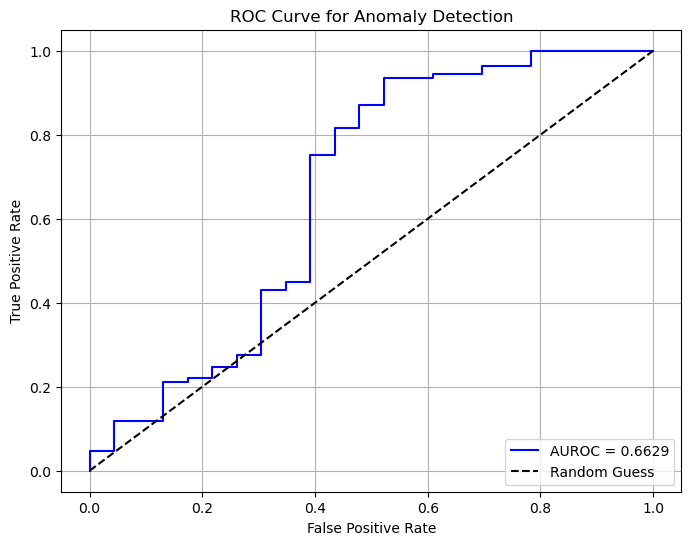

AUROC: 0.6629


In [39]:
#Tracer la courbe ROC associé au modèle Inpainting avec le dataset Capsule
plot_roc_and_auroc(a2, b2)

#### Colorizing model for Capsule dataset

In [71]:
colorization_model_capsule = ColorizationModel(latent_dim=256)
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True) 
colorization_encoder = train_ssl_model(colorization_model_capsule, 
                                       train_loader_capsule, 
                                       test_loader_capsule, 
                                       criterion=nn.MSELoss(), 
                                       optimizer=optim.Adam(colorization_model_capsule.parameters(), lr=0.001),
                                       epochs=15
                                       )

Epoch 1/15, Train Loss: 0.0714, Val Loss: 0.0271
Epoch 2/15, Train Loss: 0.0159, Val Loss: 0.0055
Epoch 3/15, Train Loss: 0.0043, Val Loss: 0.0032
Epoch 4/15, Train Loss: 0.0029, Val Loss: 0.0026
Epoch 5/15, Train Loss: 0.0018, Val Loss: 0.0014
Epoch 6/15, Train Loss: 0.0013, Val Loss: 0.0012
Epoch 7/15, Train Loss: 0.0010, Val Loss: 0.0014
Epoch 8/15, Train Loss: 0.0013, Val Loss: 0.0010
Epoch 9/15, Train Loss: 0.0008, Val Loss: 0.0012
Epoch 10/15, Train Loss: 0.0009, Val Loss: 0.0010
Epoch 11/15, Train Loss: 0.0008, Val Loss: 0.0011
Epoch 12/15, Train Loss: 0.0008, Val Loss: 0.0009
Epoch 13/15, Train Loss: 0.0008, Val Loss: 0.0011
Epoch 14/15, Train Loss: 0.0006, Val Loss: 0.0009
Epoch 15/15, Train Loss: 0.0010, Val Loss: 0.0011


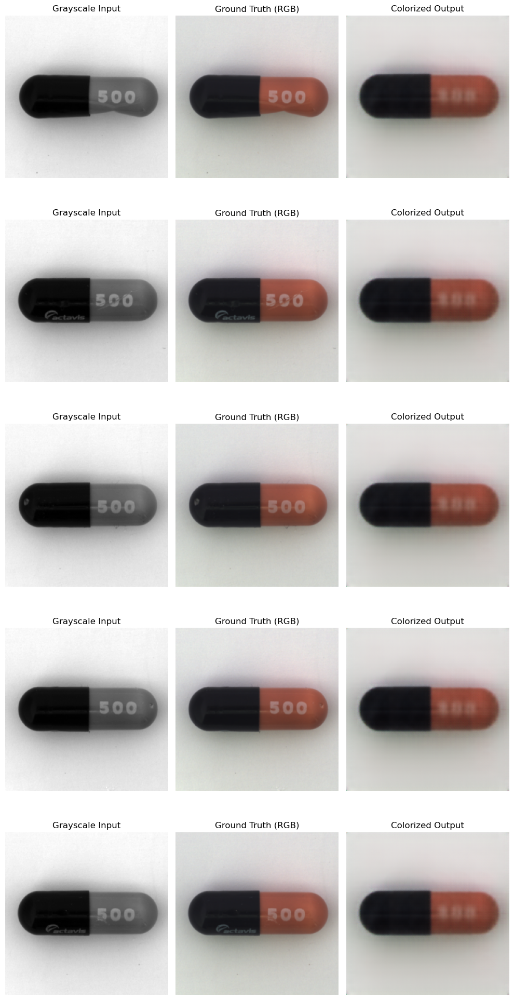

In [72]:
visualize_reconstructions(colorization_model_capsule, test_loader_capsule, device)

In [73]:
a3,b3=calculate_anomaly_scores(colorization_model_capsule, test_loader_capsule, device='cpu')

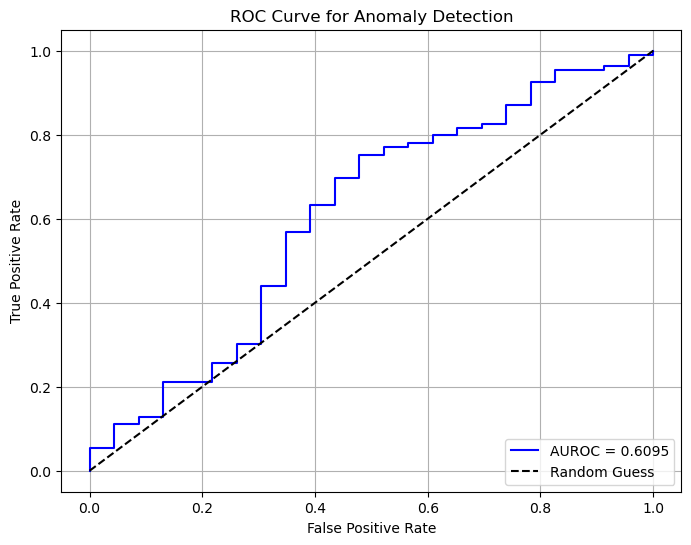

AUROC: 0.6095


In [74]:
#Tracer la courbe ROC associé au modèle Colorizing avec le dataset Capsule
plot_roc_and_auroc(a3, b3)

### c) Catégorie "Hazelnut"

In [76]:
#Chargement des données Train Hazelnut
train_path_hazelnut="/Users/macbookpro/Desktop/HDDL/SSL/hazelnut/train"
train_loader_hazelnut = load_train_data(train_path_hazelnut, img_size=(256, 256), batch_size=32)

In [77]:
#Chargement des données Test Hazelnut
test_path_hazelnut="/Users/macbookpro/Desktop/HDDL/SSL/hazelnut/test"
test_loader_hazelnut = load_test_data(test_path_hazelnut)

#### Masked autoencoder for hazelnut dataset

In [42]:
MAE_model_hazelnut = MaskedAutoencoderModel(latent_dim=256, mask_ratio=1/16)
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True)  
optimizer = optim.Adam(MAE_model_hazelnut.parameters(), lr=1e-3)
# Entraînement du modèle MAE sur le dataset Hazelnut
train_ssl_model(MAE_model_hazelnut, train_loader_hazelnut, test_loader_hazelnut, ssim_loss_fn, optimizer,epochs=25)

Epoch 1/25, Train Loss: 0.4870, Val Loss: 0.4472
Epoch 2/25, Train Loss: 0.4745, Val Loss: 0.4249
Epoch 3/25, Train Loss: 0.4228, Val Loss: 0.3153
Epoch 4/25, Train Loss: 0.2971, Val Loss: 0.2330
Epoch 5/25, Train Loss: 0.2141, Val Loss: 0.1860
Epoch 6/25, Train Loss: 0.1776, Val Loss: 0.1735
Epoch 7/25, Train Loss: 0.1607, Val Loss: 0.1569
Epoch 8/25, Train Loss: 0.1495, Val Loss: 0.1470
Epoch 9/25, Train Loss: 0.1355, Val Loss: 0.1338
Epoch 10/25, Train Loss: 0.1265, Val Loss: 0.1257
Epoch 11/25, Train Loss: 0.1233, Val Loss: 0.1239
Epoch 12/25, Train Loss: 0.1181, Val Loss: 0.1240
Epoch 13/25, Train Loss: 0.1163, Val Loss: 0.1202
Epoch 14/25, Train Loss: 0.1140, Val Loss: 0.1185
Epoch 15/25, Train Loss: 0.1128, Val Loss: 0.1173
Epoch 16/25, Train Loss: 0.1104, Val Loss: 0.1140
Epoch 17/25, Train Loss: 0.1077, Val Loss: 0.1122
Epoch 18/25, Train Loss: 0.1051, Val Loss: 0.1113
Epoch 19/25, Train Loss: 0.1031, Val Loss: 0.1085
Epoch 20/25, Train Loss: 0.1014, Val Loss: 0.1083
Epoch 21/

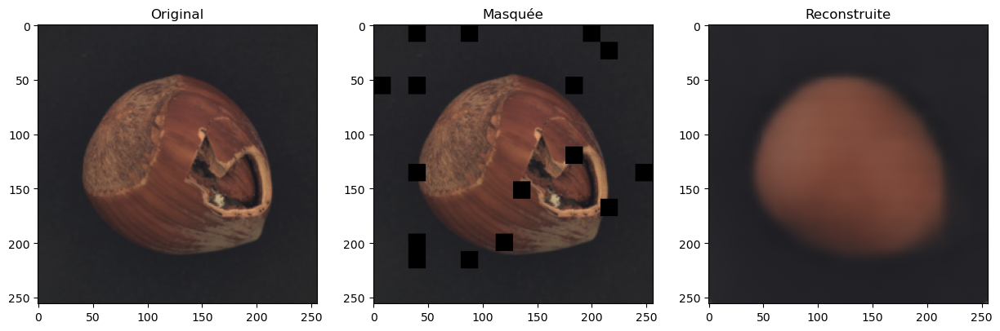

In [44]:
# Exemple d'une image
with torch.no_grad():
    images_hazelnut, _ = next(iter(test_loader_hazelnut))
    images_hazelnut = images_hazelnut.to('mps')
    reconstructed_hazelnut_MAE, masked_hazelnut_MAE = MAE_model_hazelnut(images_hazelnut)

    show_images(images_hazelnut[5], masked_hazelnut_MAE[5], reconstructed_hazelnut_MAE[5])

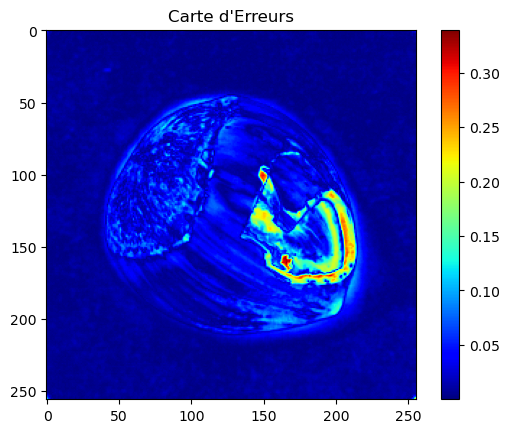

In [47]:
#Détection d'anomalie sur un exemple du dataset Hazelnut
anomaly_detection_map (images_hazelnut,reconstructed_hazelnut_MAE,5)

In [48]:
#Calcul des scores d'anomalie pour le modèle MAE avec le dataset Hazelnut
u,v=calculate_anomaly_scores(MAE_model_hazelnut, test_loader_hazelnut, device='cpu')

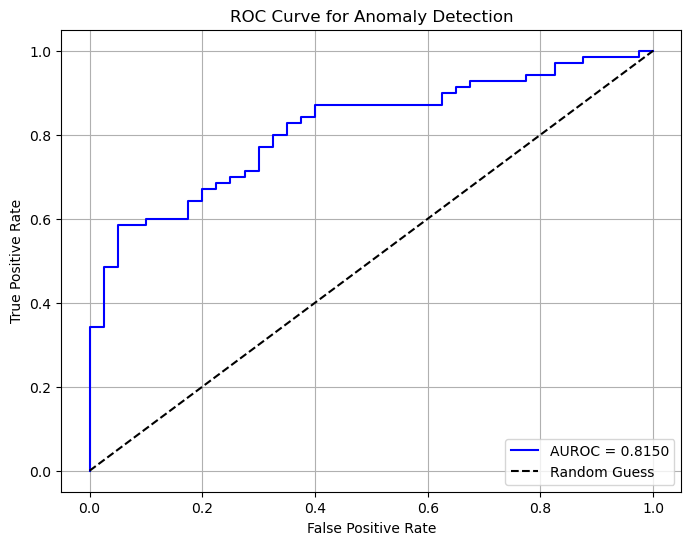

AUROC: 0.8150


In [49]:
#Tracer la courbe ROC associé au modèle MAE avec le dataset Hazelnut
plot_roc_and_auroc(u,v)

#### Inpainting model for hazelnut dataset

In [50]:
Inpainting_model_hazelnut = InpaintingModel(latent_dim=256,mask_size=30)
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True)  
optimizer = optim.Adam(Inpainting_model_hazelnut.parameters(), lr=1e-3)
# Entraînement du modèle Inpainting sur le dataset Hazelnut
train_ssl_model(Inpainting_model_hazelnut, train_loader_hazelnut, test_loader_hazelnut, ssim_loss_fn, optimizer,epochs=20)

Epoch 1/20, Train Loss: 0.5132, Val Loss: 0.4718
Epoch 2/20, Train Loss: 0.4910, Val Loss: 0.4559
Epoch 3/20, Train Loss: 0.3837, Val Loss: 0.3153
Epoch 4/20, Train Loss: 0.2694, Val Loss: 0.2345
Epoch 5/20, Train Loss: 0.2218, Val Loss: 0.2016
Epoch 6/20, Train Loss: 0.1926, Val Loss: 0.1827
Epoch 7/20, Train Loss: 0.1730, Val Loss: 0.1664
Epoch 8/20, Train Loss: 0.1575, Val Loss: 0.1536
Epoch 9/20, Train Loss: 0.1440, Val Loss: 0.1428
Epoch 10/20, Train Loss: 0.1326, Val Loss: 0.1312
Epoch 11/20, Train Loss: 0.1282, Val Loss: 0.1285
Epoch 12/20, Train Loss: 0.1234, Val Loss: 0.1332
Epoch 13/20, Train Loss: 0.1213, Val Loss: 0.1249
Epoch 14/20, Train Loss: 0.1211, Val Loss: 0.1285
Epoch 15/20, Train Loss: 0.1204, Val Loss: 0.1286
Epoch 16/20, Train Loss: 0.1201, Val Loss: 0.1251
Epoch 17/20, Train Loss: 0.1185, Val Loss: 0.1234
Epoch 18/20, Train Loss: 0.1186, Val Loss: 0.1224
Epoch 19/20, Train Loss: 0.1187, Val Loss: 0.1250
Epoch 20/20, Train Loss: 0.1183, Val Loss: 0.1214


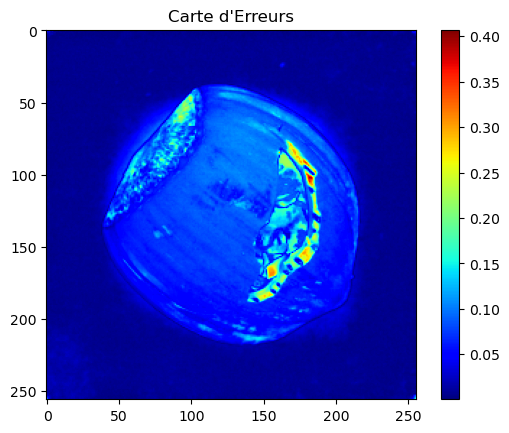

In [52]:
#Détection d'anomalie sur un exemple du dataset Hazelnut
anomaly_detection_map (images_hazelnut,reconstructed_hazelnut_inpainting,4)

In [53]:
#Calcul des scores d'anomalie pour le modèle Inpainting avec le dataset Hazelnut
u2,v2=calculate_anomaly_scores(Inpainting_model_hazelnut, test_loader_hazelnut, device='cpu')

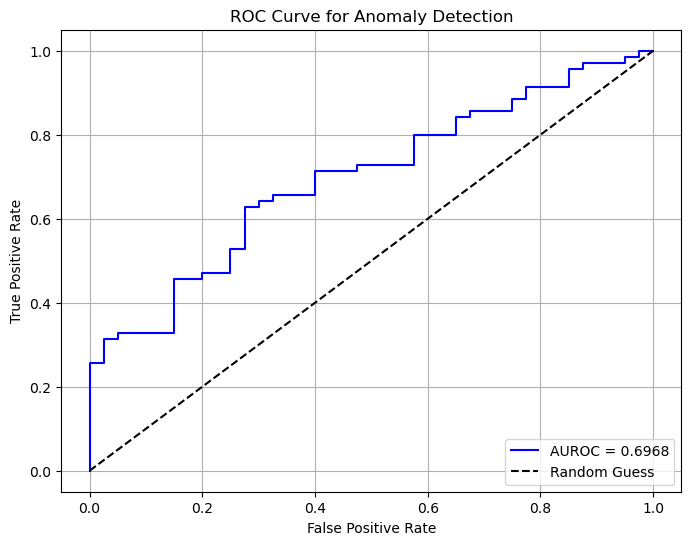

AUROC: 0.6968


In [54]:
#Tracer la courbe ROC associé au modèle Inpainting avec le dataset Hazelnut
plot_roc_and_auroc(u2, v2)

#### Colorizing model for Hazelnut dataset

In [78]:
colorization_model_hazelnut = ColorizationModel(latent_dim=256)
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True) 
colorization_encoder = train_ssl_model(colorization_model_hazelnut, 
                                       train_loader_hazelnut, 
                                       test_loader_hazelnut, 
                                       criterion=nn.MSELoss(), 
                                       optimizer=optim.Adam(colorization_model_hazelnut.parameters(), lr=0.001),
                                       epochs=25
                                       )

Epoch 1/25, Train Loss: 0.0667, Val Loss: 0.0574
Epoch 2/25, Train Loss: 0.0501, Val Loss: 0.0559
Epoch 3/25, Train Loss: 0.0191, Val Loss: 0.0110
Epoch 4/25, Train Loss: 0.0258, Val Loss: 0.0126
Epoch 5/25, Train Loss: 0.0090, Val Loss: 0.0089
Epoch 6/25, Train Loss: 0.0075, Val Loss: 0.0071
Epoch 7/25, Train Loss: 0.0066, Val Loss: 0.0063
Epoch 8/25, Train Loss: 0.0060, Val Loss: 0.0058
Epoch 9/25, Train Loss: 0.0055, Val Loss: 0.0053
Epoch 10/25, Train Loss: 0.0048, Val Loss: 0.0047
Epoch 11/25, Train Loss: 0.0038, Val Loss: 0.0038
Epoch 12/25, Train Loss: 0.0031, Val Loss: 0.0031
Epoch 13/25, Train Loss: 0.0023, Val Loss: 0.0030
Epoch 14/25, Train Loss: 0.0019, Val Loss: 0.0025
Epoch 15/25, Train Loss: 0.0017, Val Loss: 0.0026
Epoch 16/25, Train Loss: 0.0015, Val Loss: 0.0022
Epoch 17/25, Train Loss: 0.0014, Val Loss: 0.0022
Epoch 18/25, Train Loss: 0.0013, Val Loss: 0.0020
Epoch 19/25, Train Loss: 0.0012, Val Loss: 0.0020
Epoch 20/25, Train Loss: 0.0012, Val Loss: 0.0020
Epoch 21/

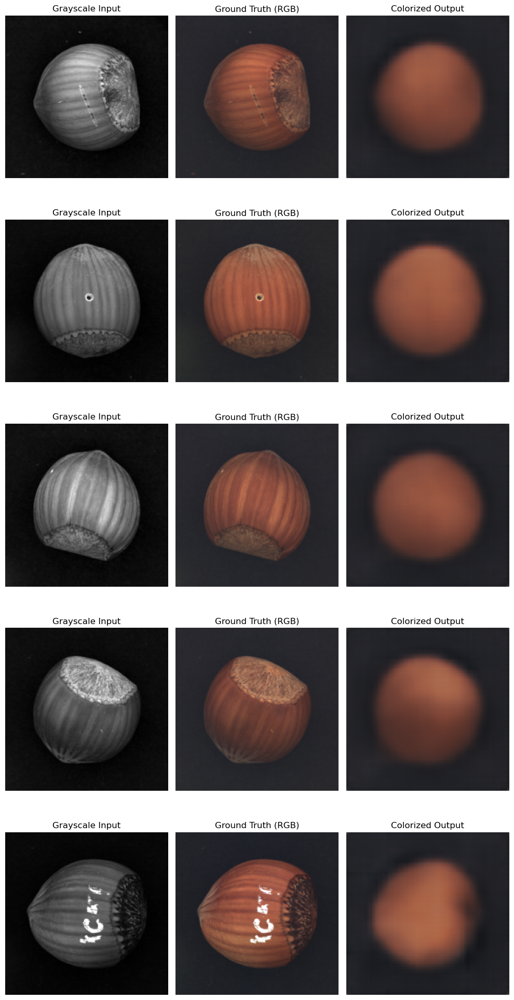

In [79]:
visualize_reconstructions(colorization_model_hazelnut, test_loader_hazelnut, device)

In [80]:
u3,v3=calculate_anomaly_scores(colorization_model_hazelnut, test_loader_hazelnut, device='cpu')

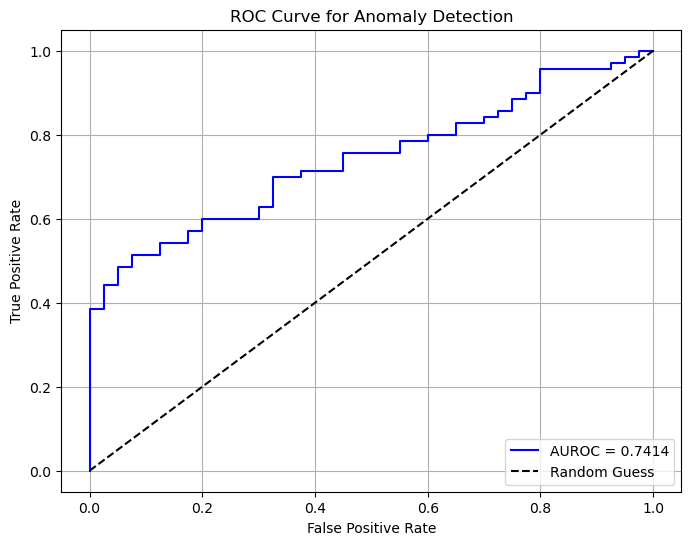

AUROC: 0.7414


In [81]:
#Tracer la courbe ROC associé au modèle MAE avec le dataset Hazelnut
plot_roc_and_auroc(u3,v3)

### d) Catégorie "Toothbrush"

In [83]:
#Chargement des données Train Toothbrush
train_path_toothbrush="/Users/macbookpro/Desktop/HDDL/SSL/toothbrush/train"
train_loader_toothbrush = load_train_data(train_path_toothbrush, img_size=(256, 256), batch_size=32)

In [84]:
#Chargement des données Test Toothbrush
test_path_toothbrush="/Users/macbookpro/Desktop/HDDL/SSL/toothbrush/test"
test_loader_toothbrush = load_test_data(test_path_toothbrush)

#### Masked Autoencoder for Toothbrush

In [110]:
MAE_model_toothbrush = MaskedAutoencoderModel(latent_dim=1024, mask_ratio=1/16)
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True)  
optimizer = optim.Adam(MAE_model_toothbrush.parameters(), lr=1e-3)
# Entraînement du modèle MAE sur le dataset Toothbrush
train_ssl_model(MAE_model_toothbrush, train_loader_toothbrush, test_loader_toothbrush, ssim_loss_fn, optimizer,epochs=75)

Epoch 1/75, Train Loss: 0.7372, Val Loss: 0.7403
Epoch 2/75, Train Loss: 0.7375, Val Loss: 0.7366
Epoch 3/75, Train Loss: 0.7353, Val Loss: 0.7361
Epoch 4/75, Train Loss: 0.7350, Val Loss: 0.7357
Epoch 5/75, Train Loss: 0.7346, Val Loss: 0.7349
Epoch 6/75, Train Loss: 0.7337, Val Loss: 0.7342
Epoch 7/75, Train Loss: 0.7327, Val Loss: 0.7330
Epoch 8/75, Train Loss: 0.7315, Val Loss: 0.7307
Epoch 9/75, Train Loss: 0.7286, Val Loss: 0.7237
Epoch 10/75, Train Loss: 0.7142, Val Loss: 0.6449
Epoch 11/75, Train Loss: 0.7107, Val Loss: 0.6897
Epoch 12/75, Train Loss: 0.6864, Val Loss: 0.6715
Epoch 13/75, Train Loss: 0.6556, Val Loss: 0.6155
Epoch 14/75, Train Loss: 0.6015, Val Loss: 0.5639
Epoch 15/75, Train Loss: 0.5476, Val Loss: 0.5189
Epoch 16/75, Train Loss: 0.5624, Val Loss: 0.5073
Epoch 17/75, Train Loss: 0.4935, Val Loss: 0.4630
Epoch 18/75, Train Loss: 0.4596, Val Loss: 0.4591
Epoch 19/75, Train Loss: 0.4470, Val Loss: 0.4432
Epoch 20/75, Train Loss: 0.4372, Val Loss: 0.4226
Epoch 21/

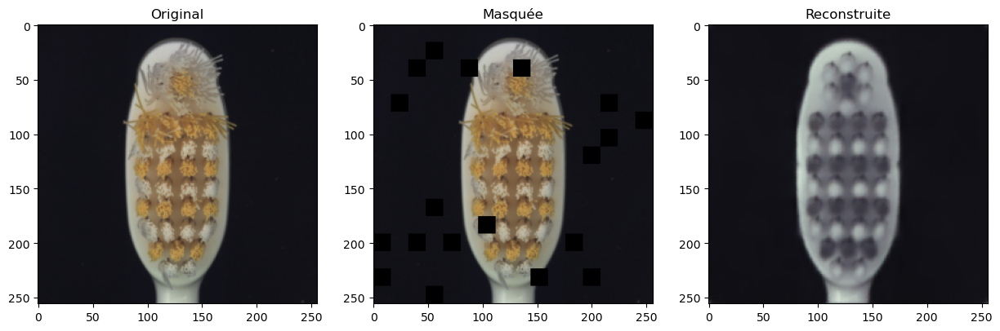

In [111]:
# Exemple d'une image
with torch.no_grad():
    images_toothbrush, _ = next(iter(test_loader_toothbrush))
    images_toothbrush = images_toothbrush.to('mps')
    reconstructed_toothbrush_MAE, masked_toothbrush_MAE = MAE_model_toothbrush(images_toothbrush)

    show_images(images_toothbrush[4], masked_toothbrush_MAE[4], reconstructed_toothbrush_MAE[4])

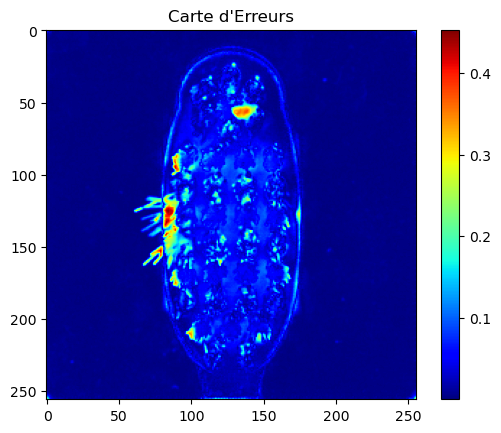

In [116]:
#Détection d'anomalie sur un exemple du dataset 
anomaly_detection_map (images_toothbrush,reconstructed_toothbrush_MAE,7)

In [114]:
#Calcul des scores d'anomalie pour le modèle MAE avec le dataset Toothbrush
u3,v3=calculate_anomaly_scores(MAE_model_toothbrush, test_loader_toothbrush, device='cpu')

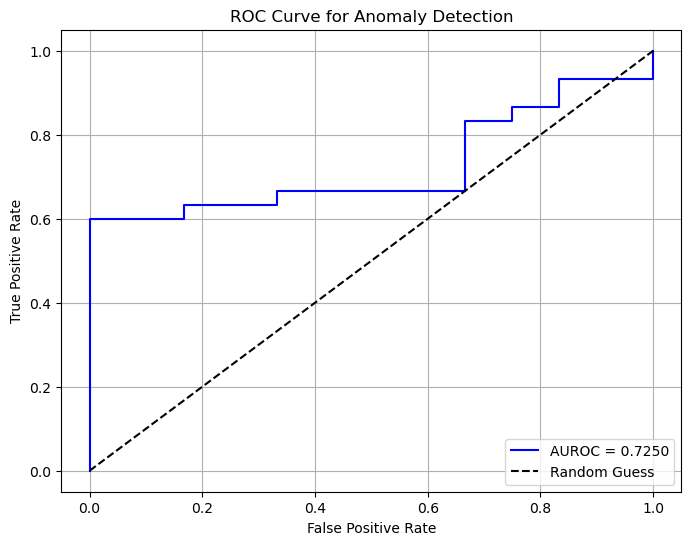

AUROC: 0.7250


In [115]:
#Tracer la courbe ROC associé au modèle MAE avec le dataset Toothbrush
plot_roc_and_auroc(u3, v3)

#### Inpainting model for Toothbrush

In [118]:
Inpainting_model_toothbrush = InpaintingModel(latent_dim=1024,mask_size=10)
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True)  
optimizer = optim.Adam(Inpainting_model_toothbrush.parameters(), lr=1e-3)
# Entraînement du modèle Inpainting sur le dataset Toothbrush
train_ssl_model(Inpainting_model_toothbrush, train_loader_toothbrush, test_loader_toothbrush, ssim_loss_fn, optimizer,epochs=75)

Epoch 1/75, Train Loss: 0.7308, Val Loss: 0.7311
Epoch 2/75, Train Loss: 0.7291, Val Loss: 0.7295
Epoch 3/75, Train Loss: 0.7284, Val Loss: 0.7289
Epoch 4/75, Train Loss: 0.7279, Val Loss: 0.7281
Epoch 5/75, Train Loss: 0.7267, Val Loss: 0.7271
Epoch 6/75, Train Loss: 0.7258, Val Loss: 0.7253
Epoch 7/75, Train Loss: 0.7234, Val Loss: 0.7215
Epoch 8/75, Train Loss: 0.7182, Val Loss: 0.7086
Epoch 9/75, Train Loss: 0.6984, Val Loss: 0.6406
Epoch 10/75, Train Loss: 0.6606, Val Loss: 0.6879
Epoch 11/75, Train Loss: 0.6886, Val Loss: 0.6897
Epoch 12/75, Train Loss: 0.6835, Val Loss: 0.6400
Epoch 13/75, Train Loss: 0.6122, Val Loss: 0.5653
Epoch 14/75, Train Loss: 0.5476, Val Loss: 0.5664
Epoch 15/75, Train Loss: 0.5417, Val Loss: 0.5124
Epoch 16/75, Train Loss: 0.4876, Val Loss: 0.4770
Epoch 17/75, Train Loss: 0.4748, Val Loss: 0.4583
Epoch 18/75, Train Loss: 0.4477, Val Loss: 0.4270
Epoch 19/75, Train Loss: 0.4229, Val Loss: 0.4138
Epoch 20/75, Train Loss: 0.4052, Val Loss: 0.3925
Epoch 21/

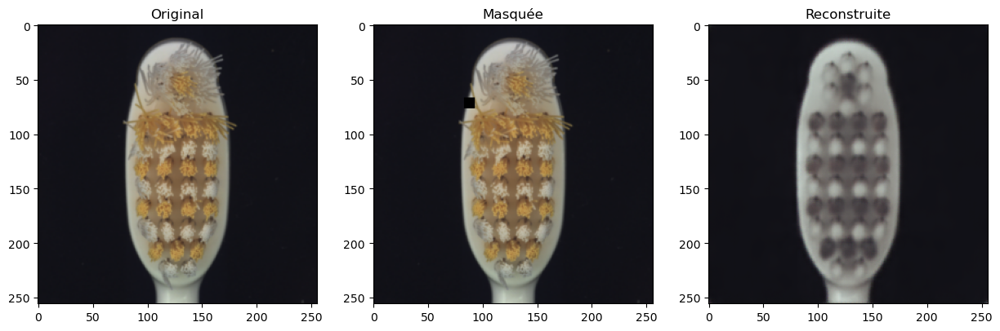

In [119]:
# Exemple d'une image
with torch.no_grad():
    images_toothbrush, _ = next(iter(test_loader_toothbrush))
    images_toothbrush = images_toothbrush.to('mps')
    reconstructed_toothbrush_inpainting, masked_toothbrush_inpainting = Inpainting_model_toothbrush(images_toothbrush)

    show_images(images_toothbrush[4], masked_toothbrush_inpainting[4], reconstructed_toothbrush_inpainting[4])

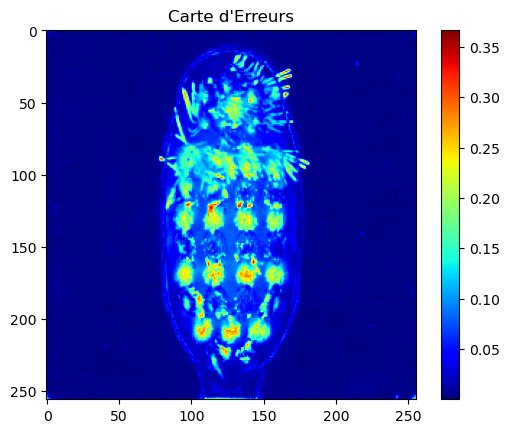

In [120]:
#Détection d'anomalie sur un exemple du dataset Toothbrush
anomaly_detection_map (images_toothbrush,reconstructed_toothbrush_inpainting,4)

In [121]:
#Calcul des scores d'anomalie pour le modèle Inpainting avec le dataset Toothbrush
u4,v4=calculate_anomaly_scores(Inpainting_model_toothbrush, test_loader_toothbrush, device='cpu')

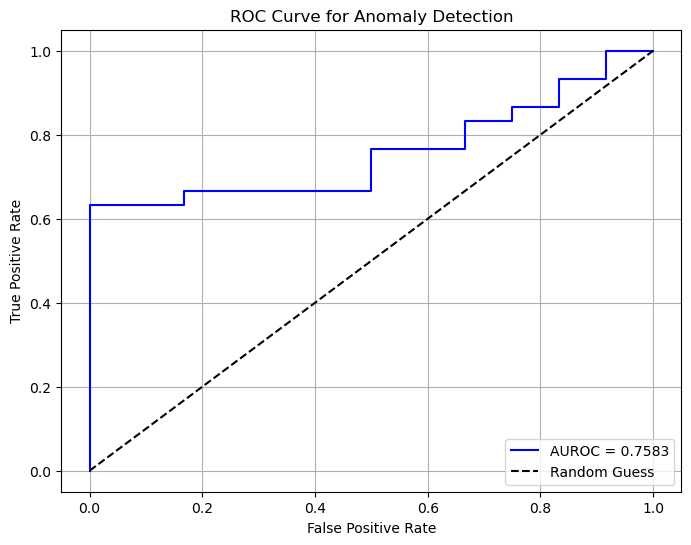

AUROC: 0.7583


In [122]:
#Tracer la courbe ROC associé au modèle Inpainting avec le dataset Toothbrush
plot_roc_and_auroc(u4, v4)

#### Colorizing model for toothbrush dataset

In [85]:
colorization_model_toothbrush = ColorizationModel(latent_dim=1024)
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True) 
colorization_encoder = train_ssl_model(colorization_model_toothbrush, 
                                       train_loader_toothbrush, 
                                       test_loader_toothbrush, 
                                       criterion=nn.MSELoss(), 
                                       optimizer=optim.Adam(colorization_model_toothbrush.parameters(), lr=0.001),
                                       epochs=25
                                       )

Epoch 1/25, Train Loss: 0.1218, Val Loss: 0.1185
Epoch 2/25, Train Loss: 0.1104, Val Loss: 0.1135
Epoch 3/25, Train Loss: 0.1131, Val Loss: 0.1025
Epoch 4/25, Train Loss: 0.0945, Val Loss: 0.0790
Epoch 5/25, Train Loss: 0.0804, Val Loss: 0.0672
Epoch 6/25, Train Loss: 0.0682, Val Loss: 0.0541
Epoch 7/25, Train Loss: 0.0476, Val Loss: 0.0293
Epoch 8/25, Train Loss: 0.0279, Val Loss: 0.0221
Epoch 9/25, Train Loss: 0.0218, Val Loss: 0.0188
Epoch 10/25, Train Loss: 0.0186, Val Loss: 0.0172
Epoch 11/25, Train Loss: 0.0171, Val Loss: 0.0152
Epoch 12/25, Train Loss: 0.0153, Val Loss: 0.0144
Epoch 13/25, Train Loss: 0.0145, Val Loss: 0.0135
Epoch 14/25, Train Loss: 0.0136, Val Loss: 0.0129
Epoch 15/25, Train Loss: 0.0131, Val Loss: 0.0124
Epoch 16/25, Train Loss: 0.0126, Val Loss: 0.0121
Epoch 17/25, Train Loss: 0.0122, Val Loss: 0.0118
Epoch 18/25, Train Loss: 0.0119, Val Loss: 0.0117
Epoch 19/25, Train Loss: 0.0124, Val Loss: 0.0116
Epoch 20/25, Train Loss: 0.0118, Val Loss: 0.0112
Epoch 21/

In [87]:
u5,v5=calculate_anomaly_scores(colorization_model_hazelnut, test_loader_hazelnut, device='cpu')

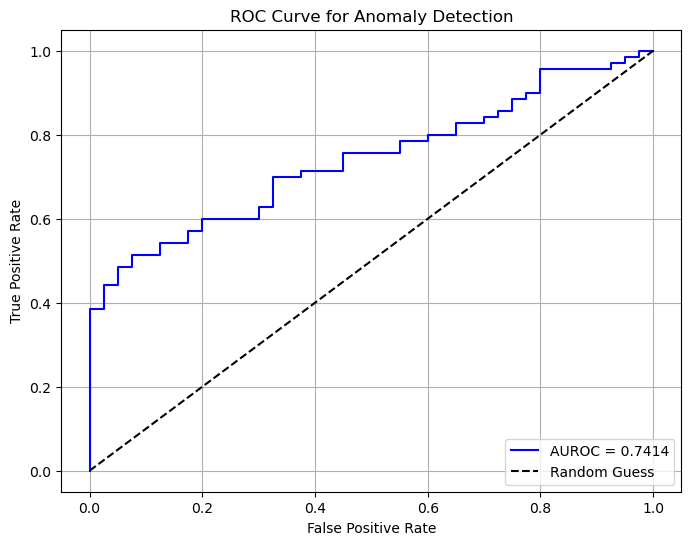

AUROC: 0.7414


In [88]:
plot_roc_and_auroc(u5,v5)

## 2. Dataset AutoVI:

### Catégorie "Engine Wiring"

In [102]:
#Chargement des données Train Engine wiring
train_path_engine="/Users/macbookpro/Desktop/HDDL/SSL/engine_wiring/train"
train_loader_engine = load_train_data(train_path_engine, img_size=(256, 256), batch_size=8)

In [103]:
#Chargement des données Test Toothbrush
test_path_engine="/Users/macbookpro/Desktop/HDDL/SSL/engine_wiring/test"
test_loader_engine = load_test_data(test_path_engine)

#### MAE model for engine wiring

In [104]:
MAE_model_engine = MaskedAutoencoderModel(latent_dim=512, mask_ratio=1/16)
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True)  
optimizer = optim.Adam(MAE_model_engine.parameters(), lr=1e-3)
# Entraînement du modèle MAE sur le dataset Hazelnut
train_ssl_model(MAE_model_engine, train_loader_engine, test_loader_engine, PerceptualLoss(), optimizer,epochs=25)

/opt/anaconda3/envs/torch/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/envs/torch/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/25, Train Loss: 1.0060, Val Loss: 0.9390
Epoch 2/25, Train Loss: 0.9722, Val Loss: 0.9083
Epoch 3/25, Train Loss: 0.9317, Val Loss: 0.8632
Epoch 4/25, Train Loss: 0.8702, Val Loss: 0.8176
Epoch 5/25, Train Loss: 0.8346, Val Loss: 0.7972
Epoch 6/25, Train Loss: 0.8116, Val Loss: 0.7812
Epoch 7/25, Train Loss: 0.7927, Val Loss: 0.7703
Epoch 8/25, Train Loss: 0.7765, Val Loss: 0.7576
Epoch 9/25, Train Loss: 0.7619, Val Loss: 0.7509
Epoch 10/25, Train Loss: 0.7480, Val Loss: 0.7453
Epoch 11/25, Train Loss: 0.7337, Val Loss: 0.7335
Epoch 12/25, Train Loss: 0.7174, Val Loss: 0.7227
Epoch 13/25, Train Loss: 0.7066, Val Loss: 0.7220
Epoch 14/25, Train Loss: 0.6915, Val Loss: 0.7079
Epoch 15/25, Train Loss: 0.6681, Val Loss: 0.7040
Epoch 16/25, Train Loss: 0.6551, Val Loss: 0.7004
Epoch 17/25, Train Loss: 0.6283, Val Loss: 0.6867
Epoch 18/25, Train Loss: 0.6112, Val Loss: 0.6860
Epoch 19/25, Train Loss: 0.5863, Val Loss: 0.6704
Epoch 20/25, Train Loss: 0.5671, Val Loss: 0.6714
Epoch 21/

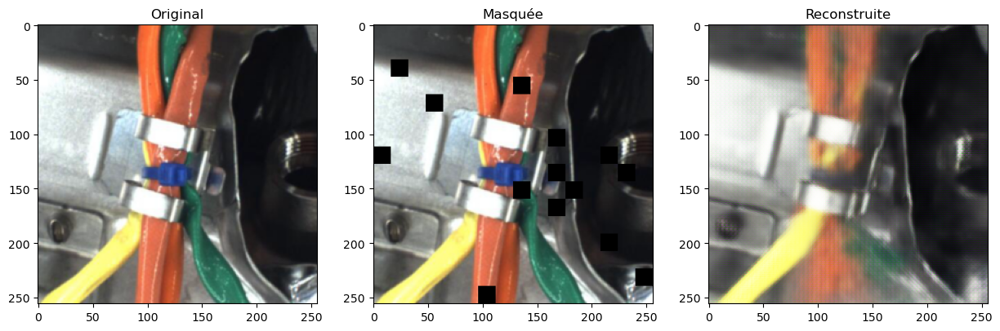

In [105]:
# Exemple d'une image
with torch.no_grad():
    images_engine, _ = next(iter(test_loader_engine))
    images_engine = images_engine.to('mps')
    reconstructed_engine_MAE, masked_engine_MAE = MAE_model_engine(images_engine)

    show_images(images_engine[4], masked_engine_MAE[4], reconstructed_engine_MAE[4])

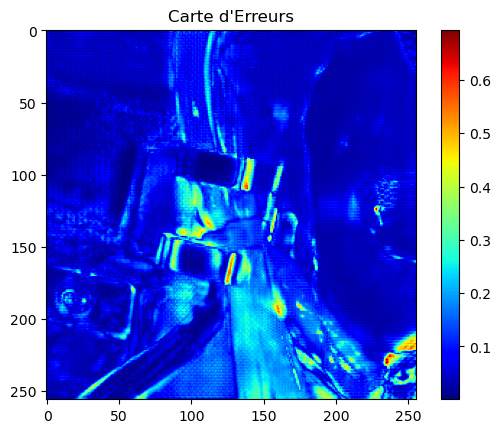

In [106]:
#Détection d'anomalie sur un exemple du dataset 
anomaly_detection_map (images_engine,reconstructed_engine_MAE,7)

In [107]:
#Calcul des scores d'anomalie pour le modèle MAE avec le dataset engine wiring
m1,n1=calculate_anomaly_scores(MAE_model_engine, test_loader_engine, device='cpu')

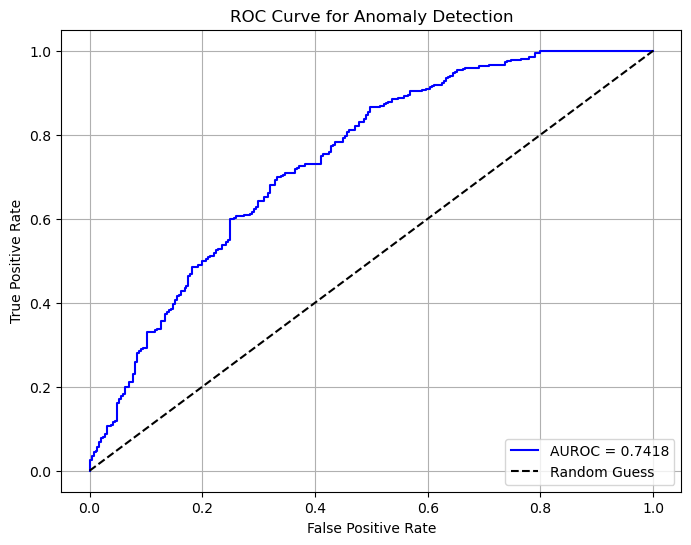

AUROC: 0.7418


In [108]:
#Tracer la courbe ROC associé au modèle MAE avec le dataset engine wiring
plot_roc_and_auroc(m1, n1)

#### Inpainting model for engine wiring

In [118]:
Inpainting_model_engine = InpaintingModel(latent_dim=512,mask_size=30)
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True)  
optimizer = optim.Adam(Inpainting_model_engine.parameters(), lr=1e-3)
# Entraînement du modèle Inpainting sur le dataset Toothbrush
train_ssl_model(Inpainting_model_engine, train_loader_engine, test_loader_engine, PerceptualLoss(), optimizer,epochs=25)

/opt/anaconda3/envs/torch/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/anaconda3/envs/torch/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/25, Train Loss: 1.7745, Val Loss: 0.9526
Epoch 2/25, Train Loss: 0.9794, Val Loss: 0.9194
Epoch 3/25, Train Loss: 0.9489, Val Loss: 0.8962
Epoch 4/25, Train Loss: 0.9272, Val Loss: 0.8777
Epoch 5/25, Train Loss: 0.9036, Val Loss: 0.8535
Epoch 6/25, Train Loss: 0.8701, Val Loss: 0.8227
Epoch 7/25, Train Loss: 0.8381, Val Loss: 0.7982
Epoch 8/25, Train Loss: 0.8142, Val Loss: 0.7812
Epoch 9/25, Train Loss: 0.7836, Val Loss: 0.7557
Epoch 10/25, Train Loss: 0.7546, Val Loss: 0.7366
Epoch 11/25, Train Loss: 0.7251, Val Loss: 0.7137
Epoch 12/25, Train Loss: 0.6972, Val Loss: 0.7013
Epoch 13/25, Train Loss: 0.6734, Val Loss: 0.6810
Epoch 14/25, Train Loss: 0.6492, Val Loss: 0.6778
Epoch 15/25, Train Loss: 0.6298, Val Loss: 0.6649
Epoch 16/25, Train Loss: 0.6095, Val Loss: 0.6579
Epoch 17/25, Train Loss: 0.5855, Val Loss: 0.6464
Epoch 18/25, Train Loss: 0.5657, Val Loss: 0.6475
Epoch 19/25, Train Loss: 0.5458, Val Loss: 0.6342
Epoch 20/25, Train Loss: 0.5283, Val Loss: 0.6331
Epoch 21/

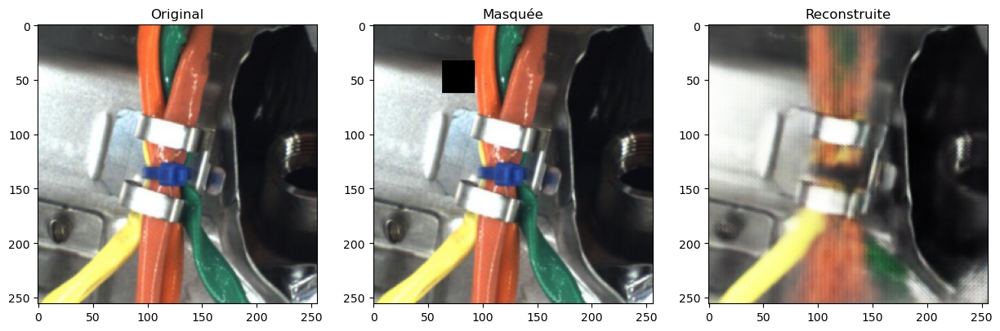

In [119]:
# Exemple d'une image
with torch.no_grad():
    images_engine, _ = next(iter(test_loader_engine))
    images_engine = images_engine.to('mps')
    reconstructed_engine_inpainting, masked_engine_inpainting = Inpainting_model_engine(images_engine)

    show_images(images_engine[4], masked_engine_inpainting[4], reconstructed_engine_inpainting[4])

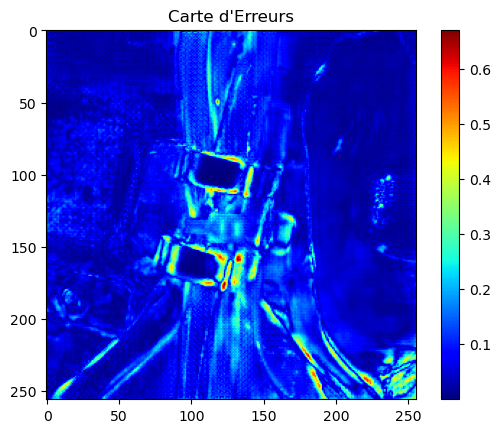

In [120]:
#Détection d'anomalie sur un exemple du dataset enine wiring
anomaly_detection_map (images_engine,reconstructed_engine_inpainting,4)

In [121]:
#Calcul des scores d'anomalie pour le modèle Inpainting avec le dataset engine wiring
m2,n2=calculate_anomaly_scores(Inpainting_model_engine, test_loader_engine, device='cpu')

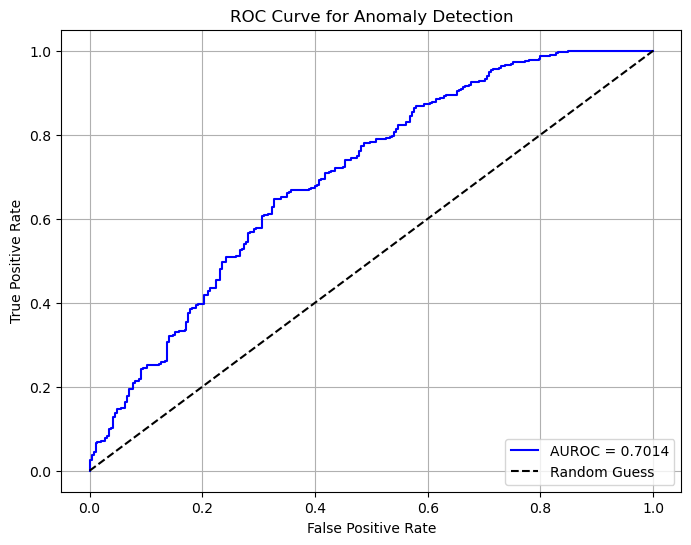

AUROC: 0.7014


In [122]:
#Tracer la courbe ROC associé au modèle Inpainting avec le dataset engine wiring
plot_roc_and_auroc(m2, n2)

#### Colorizing model for engine wiring

In [114]:
colorization_model_engine = ColorizationModel(latent_dim=512)
ssim_loss_fn = SSIMLoss(window_size=11, size_average=True) 
colorization_encoder = train_ssl_model(colorization_model_engine, 
                                       train_loader_engine, 
                                       test_loader_engine, 
                                       criterion=nn.MSELoss(), 
                                       optimizer=optim.Adam(colorization_model_engine.parameters(), lr=0.001),
                                       epochs=25
                                       )

Epoch 1/25, Train Loss: 0.0887, Val Loss: 0.0551
Epoch 2/25, Train Loss: 0.0451, Val Loss: 0.0361
Epoch 3/25, Train Loss: 0.0310, Val Loss: 0.0271
Epoch 4/25, Train Loss: 0.0237, Val Loss: 0.0251
Epoch 5/25, Train Loss: 0.0208, Val Loss: 0.0213
Epoch 6/25, Train Loss: 0.0189, Val Loss: 0.0197
Epoch 7/25, Train Loss: 0.0174, Val Loss: 0.0185
Epoch 8/25, Train Loss: 0.0163, Val Loss: 0.0183
Epoch 9/25, Train Loss: 0.0154, Val Loss: 0.0180
Epoch 10/25, Train Loss: 0.0148, Val Loss: 0.0167
Epoch 11/25, Train Loss: 0.0138, Val Loss: 0.0157
Epoch 12/25, Train Loss: 0.0129, Val Loss: 0.0150
Epoch 13/25, Train Loss: 0.0121, Val Loss: 0.0144
Epoch 14/25, Train Loss: 0.0120, Val Loss: 0.0153
Epoch 15/25, Train Loss: 0.0113, Val Loss: 0.0139
Epoch 16/25, Train Loss: 0.0106, Val Loss: 0.0137
Epoch 17/25, Train Loss: 0.0101, Val Loss: 0.0133
Epoch 18/25, Train Loss: 0.0096, Val Loss: 0.0128
Epoch 19/25, Train Loss: 0.0092, Val Loss: 0.0133
Epoch 20/25, Train Loss: 0.0090, Val Loss: 0.0129
Epoch 21/

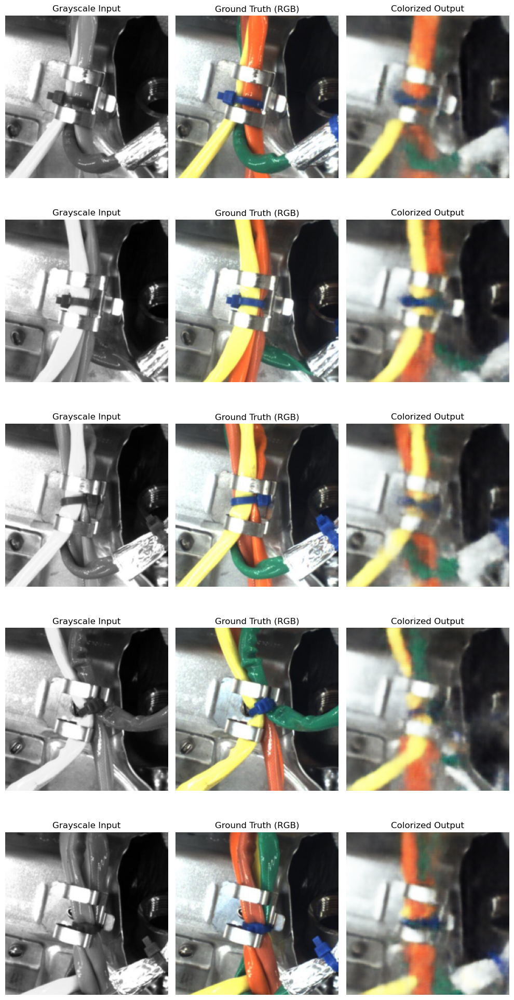

In [115]:
visualize_reconstructions(colorization_model_engine, test_loader_engine, device)

In [116]:
m3,n3=calculate_anomaly_scores(colorization_model_engine, test_loader_engine, device='cpu')

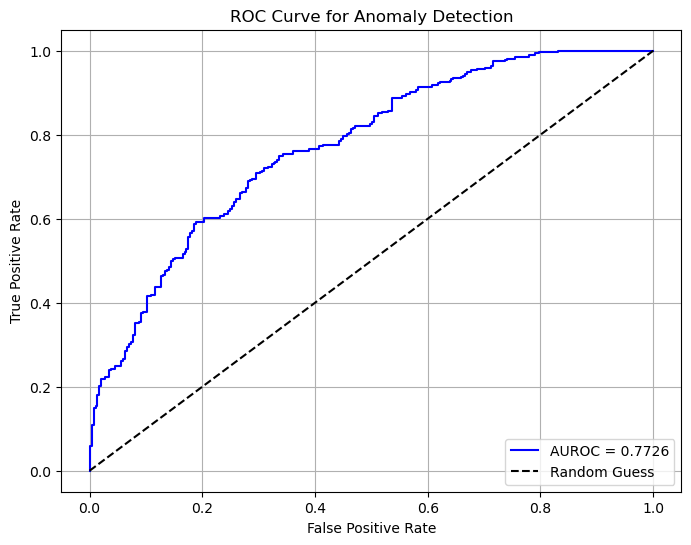

AUROC: 0.7726


In [117]:
plot_roc_and_auroc(m3,n3)

### Tableau Récapitulatif

Ce tableau nous permet de visualiser les scores **AUROC** de nos 3 modèles sur les différentes Bases de données : Bottle , Capsule , Hazelnut , Toothbrush et Engine Wiring.

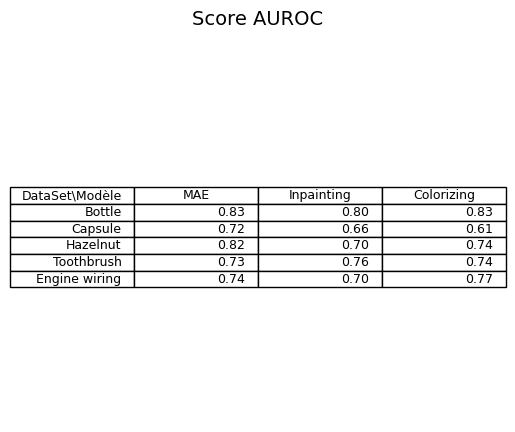

In [128]:
import matplotlib.pyplot as plt

# Données pour le tableau
data = [
    ["Bottle", "0.83", "0.80", "0.83"],
    ["Capsule", "0.72", "0.66", "0.61"],
    ["Hazelnut", "0.82", "0.70", "0.74"],
    ["Toothbrush", "0.73", "0.76", "0.74"],
    ["Engine wiring", "0.74", "0.70", "0.77"],
]

columns = ["DataSet\Modèle", "MAE", "Inpainting", "Colorizing"]

fig, ax = plt.subplots()
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=data, colLabels=columns, loc='center')

# Ajout d'un titre
plt.title("Score AUROC", fontsize=14, pad=20)

# Affichage
plt.show()